# Imports

In [220]:
'''General libraries'''
import os
import shutil
import glob
import json
import pandas
import numpy as np
from zipfile import ZipFile
'''For images'''
import SimpleITK as sitk
import dicom2nifti
import nibabel as nib
import SimpleITK as sitk


'''Pyradiomics'''
from pydicom import dcmread
from radiomics import featureextractor, getTestCase
import pydicom
import pydicom_seg


'''For plotting '''
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f

'''For statistical libraries'''
import statistics
from numpy import mean
from numpy import std
import ast
from scipy import interp


'''For Modeling'''
from sklearn import metrics
from sklearn.model_selection import KFold ,StratifiedKFold, GridSearchCV,train_test_split,cross_val_score,StratifiedGroupKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score,ConfusionMatrixDisplay,roc_curve, auc
from sklearn.feature_selection import SelectFromModel , SelectKBest , f_classif
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC



'''Directories'''
BASE_PATH = "/data4/hrehman/Clinical_Data/"

# BASE_PATH_zipped = "/data/radiogenomics/data/NSCLC_Radiogenomics/raw/"
# INPUT_FOLDER = 'data4/Clinical Data/3-13-2023/'
INPUT_FOLDER = BASE_PATH + '3-13-2023/'
# INPUT_FOLDER_zipped = BASE_PATH_zipped
# patients_zipped = os.listdir(INPUT_FOLDER_zipped)
# patients_zipped.sort()
segmentaion_dict = {}

Comparison of brain test images from github with the data we have and see if everything is ok

# Feature Extraction:

At this point we dont have to work with the conversion of the data anymore , we already have the relavent CT and the segmentation with us. Reading patinets data and try to extract the features

In [221]:
patients = os.listdir(INPUT_FOLDER)
patients.sort()
config_patinets = os.listdir(BASE_PATH + "Nifti/config")
len(config_patinets)

137

In [222]:
def extract_features():
        #Once all the files are unzipped into a new location , we will read all the patinets
        patients = os.listdir(INPUT_FOLDER)
        patients.sort()
        params = './params.yml'
        extractor = featureextractor.RadiomicsFeatureExtractor(params)
        features = {}

        for patient in patients:
            if str(patient+'.txt') in config_patinets:
                path = BASE_PATH + "Nifti/" + patient
                print(patient)
                image = sitk.ReadImage(path + "/CT/"+"/output.nii")
                mask = sitk.ReadImage(path + "/SEG/"+patient+".nii")
                # image = sitk.Cast(image,sitk.sitkInt16)
                # mask = sitk.Cast(mask,sitk.sitkInt16)
                # Since the origin and the physical space issue is encountred, we will set them same for both of the images
                # get physical info for image
                spacing = image.GetSpacing()
                direction = image.GetDirection()
                origin = image.GetOrigin()
                # set physical info
                mask.SetSpacing(spacing)
                mask.SetOrigin(origin)
                mask.SetDirection(direction)
                features[patient] = extractor.execute( image, mask)
        # A list of the valid features from any case id, sorted
        feature_names = list(sorted(filter ( lambda k: k.startswith("original_"), features.get('R01-003'))))

        feature_dict = {}

        for patient in patients:
            dict = {}
            feature_dict[patient] = patient
            for feature_name in feature_names: 
                dict[feature_name]  = features[patient][feature_name].item()
            feature_dict[patient]= dict
        with open(BASE_PATH + "Nifti/HC_features.json", 'w') as f:
                json.dump(feature_dict, f)
        return features,feature_names

In [223]:
'''we will run this function incase we dont have the HC features file'''
features,feature_names  = extract_features()

R01-001


R01-002
R01-003
R01-004
R01-005


In [ ]:
with open(BASE_PATH + "Nifti/HC_features.json", 'r') as f:
    data_read = json.load(f)

In [ ]:
len(patients)

137

In [ ]:
# Make a numpy array of all the values
import numpy as np
count = 0
samples = np.zeros((len(config_patinets),len(feature_names)))
for patient in patients:
    if str(patient+'.txt') in config_patinets:
        a = np.array([])
        for feature_name in feature_names:
            a = np.append(a, features[patient][feature_name])
        samples[count,:] = a
        count +=1
# May have NaNs
samples = np.nan_to_num(samples)

Now that we have all the features from all the patients from available dataset of 5 ids, we will use the above feature names and perform scaling

# Dimensionality Reduction

## Multidimensional scaling:

Multidimensional scaling or MDS is as way to visualize very high dimensional data in a lower dimensional space. In our case, the feature space is len(feature_names) (or 93) dimensional space. To help us understand the data, we project into 2d space. MDS preserves the relative distance between sample points during the projection, so two samples close together in 2d space would also be close together in the original 93-dimensional space (and vice versa).

We us non-metric algorithm, because our data are highly non uniform in the scale of each feature.

In [ ]:
#With no metrics
from sklearn import manifold
from sklearn.metrics import euclidean_distances
from sklearn.decomposition import PCA

similarities = euclidean_distances(samples)


seed = np.random.RandomState(seed=3)

mds = manifold.MDS(n_components=2, max_iter=5000, eps=1e-12, random_state=seed,
                   n_init=len(config_patinets),
                   dissimilarity="precomputed", n_jobs=1, metric=False)
pos_MDS = mds.fit_transform(similarities)

/home/hrehman/radiomics_venv/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


## PCA:

In [ ]:
#With metrics
from sklearn import manifold
from sklearn.metrics import euclidean_distances
from sklearn.decomposition import PCA

similarities = euclidean_distances(samples)


seed = np.random.RandomState(seed=3)

mds = manifold.MDS(n_components=2, max_iter=5000, eps=1e-12, random_state=seed,
                   n_init=len(config_patinets),
                   dissimilarity="precomputed", n_jobs=1, metric=True)
pos_PCA = mds.fit_transform(similarities)

/home/hrehman/radiomics_venv/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


# Plots

Here we use the results. NB: there are two points in the "green-ish" colored circle in the center of the plot.

Looking over our features, it's likely that meningioma and astrocytoma could be distinguisted by a classifier (based on our rather limited data set), but, in at least one case, glioma and astrocytoma features are relatively close together.

In [ ]:
clinicalData = pandas.read_csv("/data4/hrehman/Clinical_Data/NSCLCR01Radiogenomic_DATA_LABELS_2018-05-22_1500-shifted.csv")
clinicalData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 40 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Case ID                                            211 non-null    object 
 1   Patient affiliation                                211 non-null    object 
 2   Age at Histological Diagnosis                      211 non-null    int64  
 3   Weight (lbs)                                       211 non-null    object 
 4   Gender                                             211 non-null    object 
 5   Ethnicity                                          211 non-null    object 
 6   Smoking status                                     211 non-null    object 
 7   Pack Years                                         163 non-null    object 
 8   Quit Smoking Year                                  108 non-null    float64
 9   %GG       

In [ ]:
histrology  = clinicalData[['Histology ','Case ID']]
histrology.rename(columns = {'Histology ':'Histology'}, inplace = True)
histrology  = histrology[histrology['Case ID'].str.contains("R01-")]
ids = [s.strip(".txt") for s in config_patinets]
histrology = histrology[histrology['Case ID'].isin(ids)]
histrology['uid'] = np.arange(len(config_patinets))
histrology.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137 entries, 49 to 194
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Histology  137 non-null    object
 1   Case ID    137 non-null    object
 2   uid        137 non-null    int64 
dtypes: int64(1), object(2)
memory usage: 4.3+ KB


/tmp/ipykernel_1705922/2304738963.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
histrology.head()

,Histology,Case ID,uid
49,Adenocarcinoma,R01-001,0
50,Adenocarcinoma,R01-002,1
51,Adenocarcinoma,R01-003,2
52,Squamous cell carcinoma,R01-004,3
53,Adenocarcinoma,R01-005,4


In [ ]:
from sklearn.preprocessing import LabelEncoder
survival_status = clinicalData[['Survival Status','Case ID']]
survival_status  = survival_status[survival_status['Case ID'].str.contains("R01-")]
ids = [s.strip(".txt") for s in config_patinets]
survival_status = survival_status[survival_status['Case ID'].isin(ids)]
survival_status['uid'] = np.arange(len(config_patinets))
# creating instance of labelencoder
labelencoder = LabelEncoder()
survival_status['labels']  = labelencoder.fit_transform(survival_status['Survival Status'])
survival_status.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137 entries, 49 to 194
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Survival Status  137 non-null    object
 1   Case ID          137 non-null    object
 2   uid              137 non-null    int64 
 3   labels           137 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 5.4+ KB


In [ ]:
survival_status.tail(5)

,Survival Status,Case ID,uid,labels
189,Alive,R01-141,132,0
190,Alive,R01-142,133,0
192,Alive,R01-144,134,0
193,Alive,R01-145,135,0
194,Dead,R01-146,136,1


In [ ]:
survival_status.info()

<class 'pandas.core.frame.DataFrame'>
Index: 137 entries, 49 to 194
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Survival Status  137 non-null    object
 1   Case ID          137 non-null    object
 2   uid              137 non-null    int64 
 3   labels           137 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 5.4+ KB


### With Type of Tumor

### MDS

/tmp/ipykernel_1705922/314850085.py:22: RuntimeWarning:

divide by zero encountered in divide



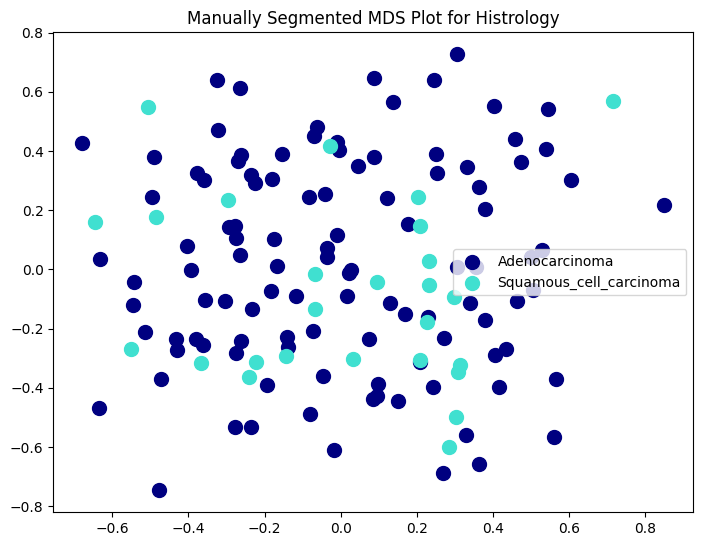

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.cm as cm
import pandas as pd

fig = plt.figure(1)
ax = plt.axes([0., 0., 1., 1.])

s = 100

# Type of tumor
Adenocarcinoma = histrology[histrology['Histology']=="Adenocarcinoma"]['uid'].values
Squamous_cell_carcinoma= histrology[histrology['Histology']=="Squamous cell carcinoma"]['uid'].values

plt.scatter(pos_MDS[Adenocarcinoma, 0], pos_MDS[Adenocarcinoma, 1], color='navy', alpha=1.0, s=s, lw=1, label='Adenocarcinoma')
plt.scatter(pos_MDS[Squamous_cell_carcinoma, 0], pos_MDS[Squamous_cell_carcinoma, 1], color='turquoise', alpha=1.0, s=s, lw=1, label='Squamous_cell_carcinoma')
# plt.scatter(pos[astrocytoma, 0], pos[astrocytoma, 1], color='darkorange', alpha=0.5, s=s, lw=1, label='astrocytoma')

plt.legend(scatterpoints=1, loc=5, shadow=False)
plt.title('Manually Segmented MDS Plot for Histrology')

similarities = similarities.max() / similarities * 100
similarities[np.isinf(similarities)] = 0
plt.show()

### PCA

/tmp/ipykernel_1705922/3815913135.py:22: RuntimeWarning:

divide by zero encountered in divide



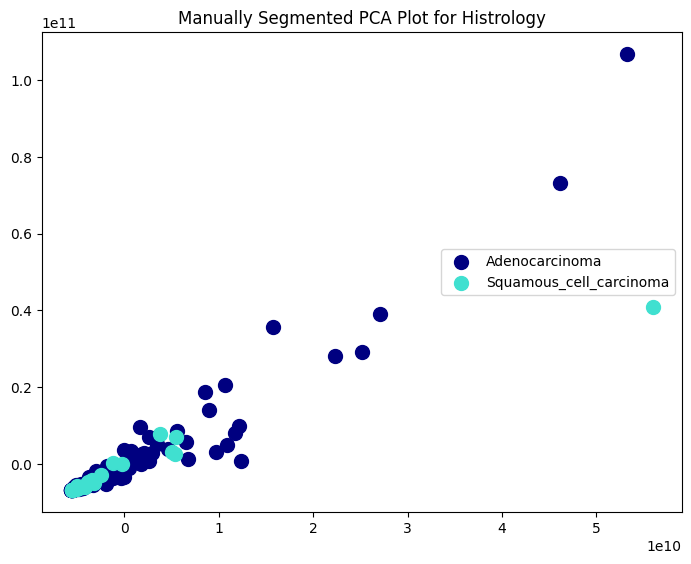

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.cm as cm


fig = plt.figure(1)
ax = plt.axes([0., 0., 1., 1.])

s = 100

# Type of tumor
Adenocarcinoma = histrology[histrology['Histology']=="Adenocarcinoma"]['uid'].values
Squamous_cell_carcinoma= histrology[histrology['Histology']=="Squamous cell carcinoma"]['uid'].values

plt.scatter(pos_PCA[Adenocarcinoma, 0], pos_PCA[Adenocarcinoma, 1], color='navy', alpha=1.0, s=s, lw=1, label='Adenocarcinoma')
plt.scatter(pos_PCA[Squamous_cell_carcinoma, 0], pos_PCA[Squamous_cell_carcinoma, 1], color='turquoise', alpha=1.0, s=s, lw=1, label='Squamous_cell_carcinoma')
# plt.scatter(pos[astrocytoma, 0], pos[astrocytoma, 1], color='darkorange', alpha=0.5, s=s, lw=1, label='astrocytoma')

plt.legend(scatterpoints=1, loc=5, shadow=False)
plt.title('Manually Segmented PCA Plot for Histrology')

similarities = similarities.max() / similarities * 100
similarities[np.isinf(similarities)] = 0
plt.show()

### With Type of Survial Status

### MDS

/tmp/ipykernel_1705922/964356304.py:22: RuntimeWarning:

divide by zero encountered in divide



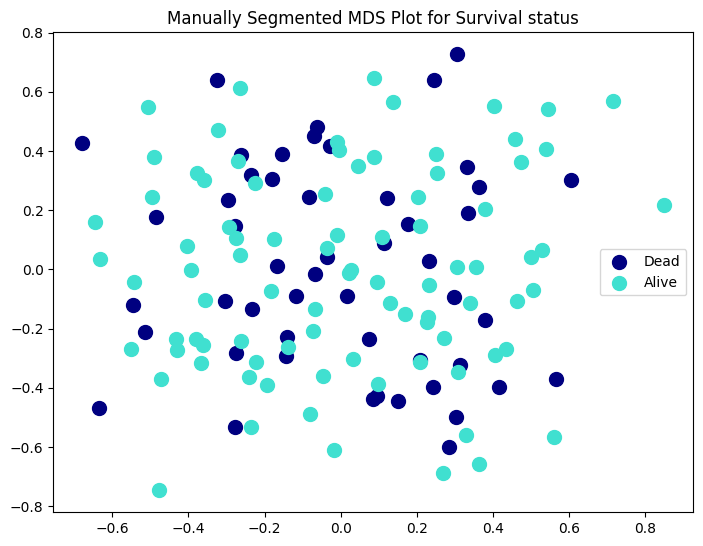

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.cm as cm


fig = plt.figure(1)
ax = plt.axes([0., 0., 1., 1.])

s = 100

# survival status
dead = survival_status[survival_status['labels']==1]['uid'].values
alive = survival_status[survival_status['labels']==0]['uid'].values

plt.scatter(pos_MDS[dead, 0], pos_MDS[dead, 1], color='navy', alpha=1.0, s=s, lw=1, label='Dead')
plt.scatter(pos_MDS[alive, 0], pos_MDS[alive, 1], color='turquoise', alpha=1.0, s=s, lw=1, label='Alive')
# plt.scatter(pos[astrocytoma, 0], pos[astrocytoma, 1], color='darkorange', alpha=0.5, s=s, lw=1, label='astrocytoma')

plt.legend(scatterpoints=1, loc=5, shadow=False)
plt.title('Manually Segmented MDS Plot for Survival status')

similarities = similarities.max() / similarities * 100
similarities[np.isinf(similarities)] = 0
plt.show()

### PCA

/tmp/ipykernel_1705922/3356938581.py:21: RuntimeWarning:

divide by zero encountered in divide



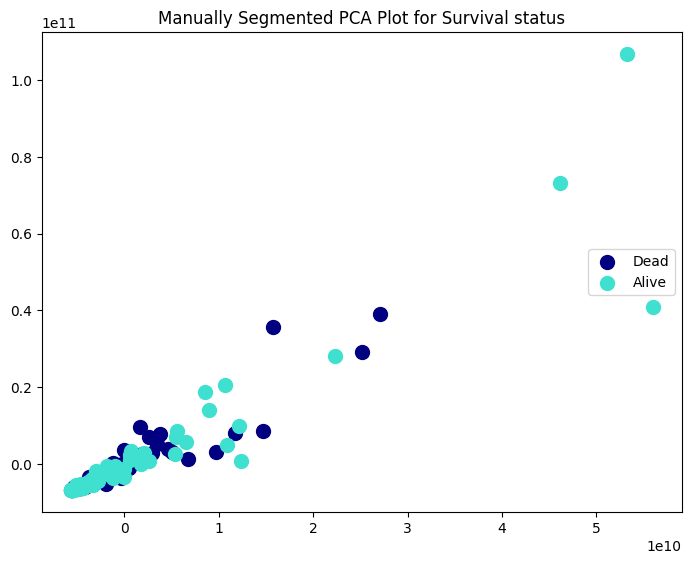

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.cm as cm


fig = plt.figure(1)
ax = plt.axes([0., 0., 1., 1.])

s = 100

# survival status
dead = survival_status[survival_status['labels']==1]['uid'].values
alive = survival_status[survival_status['labels']==0]['uid'].values

plt.scatter(pos_PCA[dead, 0], pos_PCA[dead, 1], color='navy', alpha=1.0, s=s, lw=1, label='Dead')
plt.scatter(pos_PCA[alive, 0], pos_PCA[alive, 1], color='turquoise', alpha=1.0, s=s, lw=1, label='Alive')
# plt.scatter(pos[astrocytoma, 0], pos[astrocytoma, 1], color='darkorange', alpha=0.5, s=s, lw=1, label='astrocytoma')

plt.legend(scatterpoints=1, loc=5, shadow=False)
plt.title('Manually Segmented PCA Plot for Survival status')
similarities = similarities.max() / similarities * 100
similarities[np.isinf(similarities)] = 0
plt.show()

### Plot features as a heatmap

In [ ]:
# data_labels = pd.read_csv("/data4/hrehman/Clinical Data/NSCLCR01Radiogenomic_DATA_LABELS_2018-05-22_1500-shifted.csv")
# data_labels = data_labels['']
# types = np.array(csv['Histology'])

In [ ]:
# import pandas as pd
# import seaborn as sns

# # type of each tumor
# types =['meningioma', 'meningioma', 'meningioma', 'glioma', 'astrocytoma', 'glioma', 'astrocytoma', 'astrocytoma', 'astrocytoma', 'glioma']
# types = 

# # Construct a pandas dataframe from the samples
# d = pd.DataFrame(data=samples, columns=feature_names, index=types)

# corr = d.corr()

# # Set up the matplotlib figure, make it big!
# f, ax = plt.subplots(figsize=(15, 10))

# # Draw the heatmap using seaborn
# sns.heatmap(corr, vmax=.8, square=True)

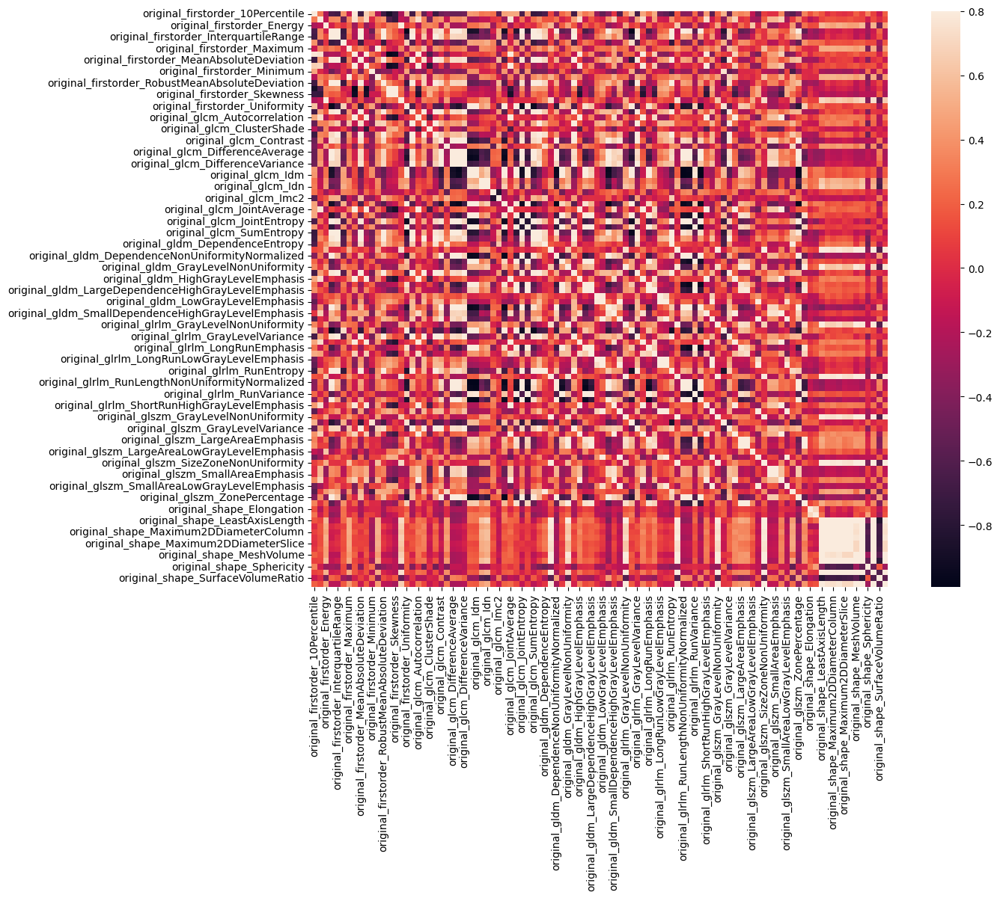

In [ ]:
# Construct a pandas dataframe from the samples
d = pandas.DataFrame(data=samples, columns=feature_names)
corr = d.corr()

# Set up the matplotlib figure, make it big!
f, ax = plt.subplots(figsize=(15, 10))

# Draw the heatmap using seaborn
sns.heatmap(corr, vmax=.8, square=True)
plt.show()

### Cluster the heatmap

/home/hrehman/radiomics_venv/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/home/hrehman/radiomics_venv/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



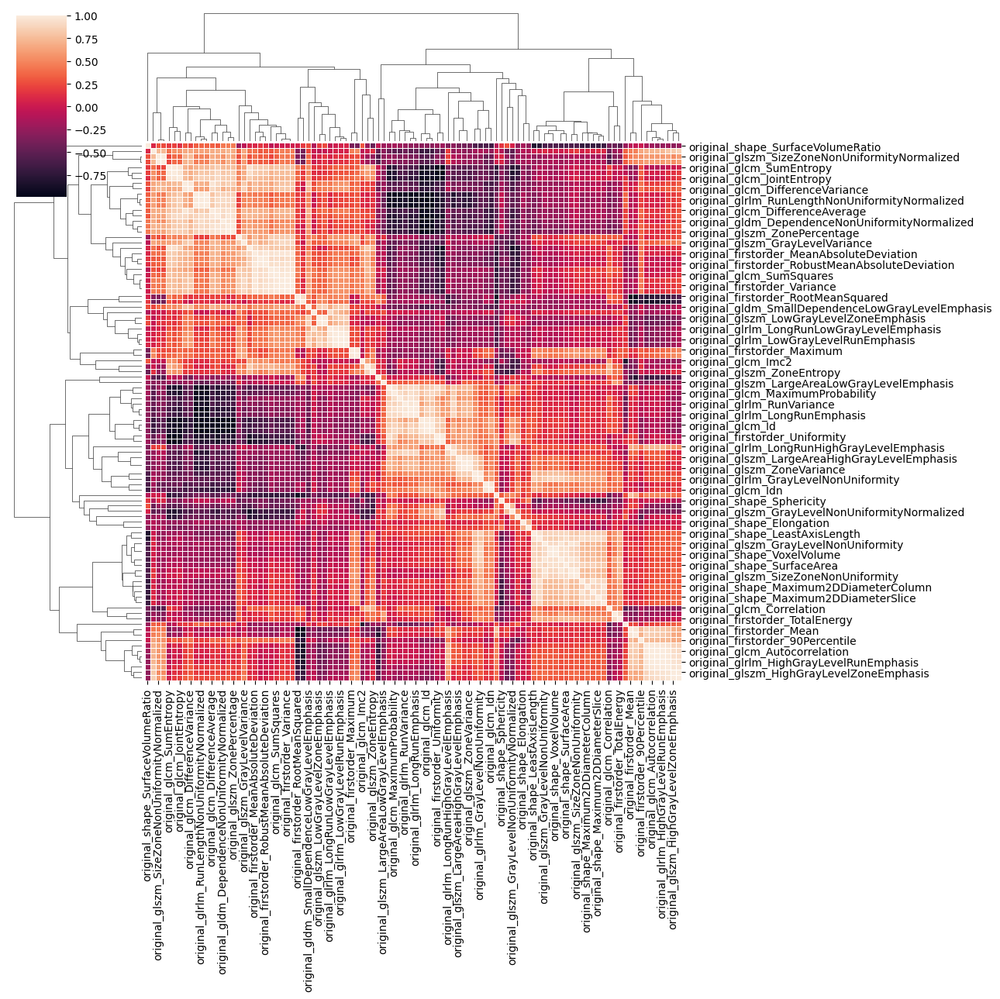

In [ ]:
# Choose a subset of features for clustering
dd = d.iloc[:,:]

pp = sns.clustermap(dd.corr(), linewidths=.5, figsize=(13,13))
_ = plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)

### PCP

In [ ]:
survival_status

,Survival Status,Case ID,uid,labels
49,Alive,R01-001,0,0
50,Alive,R01-002,1,0
51,Alive,R01-003,2,0
52,Alive,R01-004,3,0
53,Dead,R01-005,4,1
...,...,...,...,...
189,Alive,R01-141,132,0
190,Alive,R01-142,133,0
192,Alive,R01-144,134,0
193,Alive,R01-145,135,0


In [ ]:
d['uid'] = np.arange(len(config_patinets))
d['survival_status'] = list(survival_status['labels'])
d.columns[10:50]

Index(['original_firstorder_Minimum', 'original_firstorder_Range',
       'original_firstorder_RobustMeanAbsoluteDeviation',
       'original_firstorder_RootMeanSquared', 'original_firstorder_Skewness',
       'original_firstorder_TotalEnergy', 'original_firstorder_Uniformity',
       'original_firstorder_Variance', 'original_glcm_Autocorrelation',
       'original_glcm_ClusterProminence', 'original_glcm_ClusterShade',
       'original_glcm_ClusterTendency', 'original_glcm_Contrast',
       'original_glcm_Correlation', 'original_glcm_DifferenceAverage',
       'original_glcm_DifferenceEntropy', 'original_glcm_DifferenceVariance',
       'original_glcm_Id', 'original_glcm_Idm', 'original_glcm_Idmn',
       'original_glcm_Idn', 'original_glcm_Imc1', 'original_glcm_Imc2',
       'original_glcm_InverseVariance', 'original_glcm_JointAverage',
       'original_glcm_JointEnergy', 'original_glcm_JointEntropy',
       'original_glcm_MaximumProbability', 'original_glcm_SumEntropy',
       'origi

In [ ]:
import numpy as np
count = 0
samples_full_data = np.zeros((len(config_patinets)+1,len(feature_names)+1))
for patient in patients:
    if str(patient+'.txt') in config_patinets:
        a = np.array([])
        for feature_name in feature_names:
            a = np.append(a, features[patient][feature_name])
        a = np.append(a,int(patient.strip('-')[-1]))
        samples_full_data[count,:] = a
        count +=1
# May have NaNs
samples_full_data = np.nan_to_num(samples_full_data)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
survival_status

,Survival Status,Case ID,uid,labels
49,Alive,R01-001,0,0
50,Alive,R01-002,1,0
51,Alive,R01-003,2,0
52,Alive,R01-004,3,0
53,Dead,R01-005,4,1
...,...,...,...,...
189,Alive,R01-141,132,0
190,Alive,R01-142,133,0
192,Alive,R01-144,134,0
193,Alive,R01-145,135,0


In [ ]:
survival_status['Case ID']

49     R01-001
50     R01-002
51     R01-003
52     R01-004
53     R01-005
        ...   
189    R01-141
190    R01-142
192    R01-144
193    R01-145
194    R01-146
Name: Case ID, Length: 137, dtype: object

In [ ]:
all_features = feature_names + ['remove']
data = pandas.DataFrame(data=samples_full_data, columns=all_features)
data = data.iloc[:-1 , :]
data = data.iloc[:, :-1]
data['labels'] = survival_status['labels'].values
data['Patient_id'] = survival_status['Case ID'].values
data['survival_status'] = survival_status['Survival Status'].values

In [ ]:
import plotly.express as px
df = data
fig = px.parallel_coordinates(df,
                              dimensions=['labels','original_shape_Sphericity', 'original_shape_SurfaceArea', 'original_shape_VoxelVolume',
                                          'original_shape_SurfaceVolumeRatio'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

In [ ]:
import plotly.express as px
df = data
fig = px.parallel_coordinates(df,
                              dimensions=['labels','original_glcm_InverseVariance', 'original_glcm_JointAverage',
       'original_glcm_JointEnergy', 'original_glcm_JointEntropy',
       'original_glcm_MaximumProbability', 'original_glcm_SumEntropy',
       'original_glcm_SumSquares', 'original_gldm_DependenceEntropy'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

Show the distribution of different variables

In [ ]:
# make a cleaner vefirst_colson
clean_df = df[feature_names].copy()
# clean_df.columns = [
#     ' '.join(c_col.split('original_')[-1].split('_')) 
#     for c_col in feature_names
# ]
clean_col_names = clean_df.columns[len(feature_names):]
# fix some of the artifacts from the radiomics tool
obj_cols = clean_df[clean_col_names].select_dtypes(['object']).columns.tolist()
for c_col in obj_cols:
    clean_df[c_col] = clean_df[c_col].map(lambda x: float(x))
clean_df.to_csv('clean_radiomics_table.csv', index=False)
clean_df.sample(3)

,original_firstorder_10Percentile,original_firstorder_90Percentile,original_firstorder_Energy,original_firstorder_Entropy,original_firstorder_InterquartileRange,original_firstorder_Kurtosis,original_firstorder_Maximum,original_firstorder_Mean,original_firstorder_MeanAbsoluteDeviation,original_firstorder_Median,...,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,original_shape_Sphericity,original_shape_SurfaceArea,original_shape_SurfaceVolumeRatio,original_shape_VoxelVolume
69,-797.0,78.0,5.553185e+08,5.483899,618.0,1.834331,473.0,-304.554467,301.125926,-243.0,...,25.997671,25.997671,27.332587,32.205699,2879.791260,19.145409,0.528215,1853.165119,0.643507,2914.672852
9,-377.0,105.0,1.126441e+09,4.125806,173.0,4.847194,231.0,-41.902310,152.750146,48.0,...,36.023774,52.540642,34.941160,52.625554,12142.449850,23.908695,0.595081,4293.176170,0.353568,12194.112566
112,-922.0,89.0,1.064427e+10,5.300147,731.0,1.710784,635.0,-308.303217,362.105532,-101.0,...,68.303638,67.042904,75.007242,75.673086,38465.902646,41.183419,0.378314,14566.301010,0.378681,38623.031616


### Distributions

In [ ]:
clean_df

,original_firstorder_10Percentile,original_firstorder_90Percentile,original_firstorder_Energy,original_firstorder_Entropy,original_firstorder_InterquartileRange,original_firstorder_Kurtosis,original_firstorder_Maximum,original_firstorder_Mean,original_firstorder_MeanAbsoluteDeviation,original_firstorder_Median,...,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,original_shape_Sphericity,original_shape_SurfaceArea,original_shape_SurfaceVolumeRatio,original_shape_VoxelVolume
0,-443.0,41.0,1.552086e+08,4.496936,282.00,2.964832,154.0,-139.272894,162.692772,-56.0,...,19.963711,21.404916,17.826214,22.938612,1284.175988,12.898148,0.631682,904.486369,0.704332,1307.151699
1,-386.1,38.0,8.860778e+07,4.192986,183.75,4.442666,144.0,-105.572558,136.108386,-33.0,...,19.049694,24.693560,20.974246,24.758850,2138.929492,13.820376,0.699161,1148.253698,0.536836,2169.325270
2,-324.4,106.0,4.174656e+07,4.332427,149.00,4.758523,290.0,-42.965257,129.546935,15.0,...,15.081161,20.041461,20.194368,21.745150,1434.448242,12.054072,0.759558,809.803327,0.564540,1454.589844
3,-501.2,148.0,1.084852e+08,4.833568,244.00,4.179931,366.0,-74.679379,195.486103,21.0,...,19.678824,24.477195,18.609795,24.935199,1302.181409,13.547928,0.576187,1000.847660,0.768593,1326.148376
4,-154.0,51.0,2.035543e+08,3.365276,59.00,10.191594,391.0,-25.891429,69.145645,6.0,...,31.155780,27.931634,32.504794,33.887109,7096.936377,21.398453,0.681077,2622.215627,0.369486,7117.235661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,-855.0,114.0,3.098198e+09,5.647720,691.00,1.741596,827.0,-326.975698,334.293630,-271.0,...,45.983183,29.453954,37.371606,46.325951,7664.534569,22.143302,0.573403,3278.546314,0.427755,7704.986572
133,-717.0,94.0,3.852615e+09,5.490919,530.00,1.921837,467.0,-276.532241,265.363025,-234.0,...,47.059968,47.437302,54.074506,62.712243,23696.295016,31.088503,0.592916,6728.904765,0.283964,23776.760269
134,-838.0,37.0,2.283232e+09,5.456589,626.00,1.805940,495.0,-457.097741,300.308602,-560.0,...,35.507167,38.523032,38.570317,40.669324,5143.475750,26.537007,0.516694,2788.830087,0.542207,5184.012286
135,-913.0,72.0,2.706531e+10,5.227012,780.00,2.610789,1350.0,-528.989135,365.137638,-743.0,...,47.811635,53.838302,48.083128,54.922185,24492.886312,34.054021,0.492914,8274.464122,0.337831,24553.646679


In [ ]:
clean_df.to_csv('/data4/hrehman/Clinical_Data/distribution_data_HC.csv')

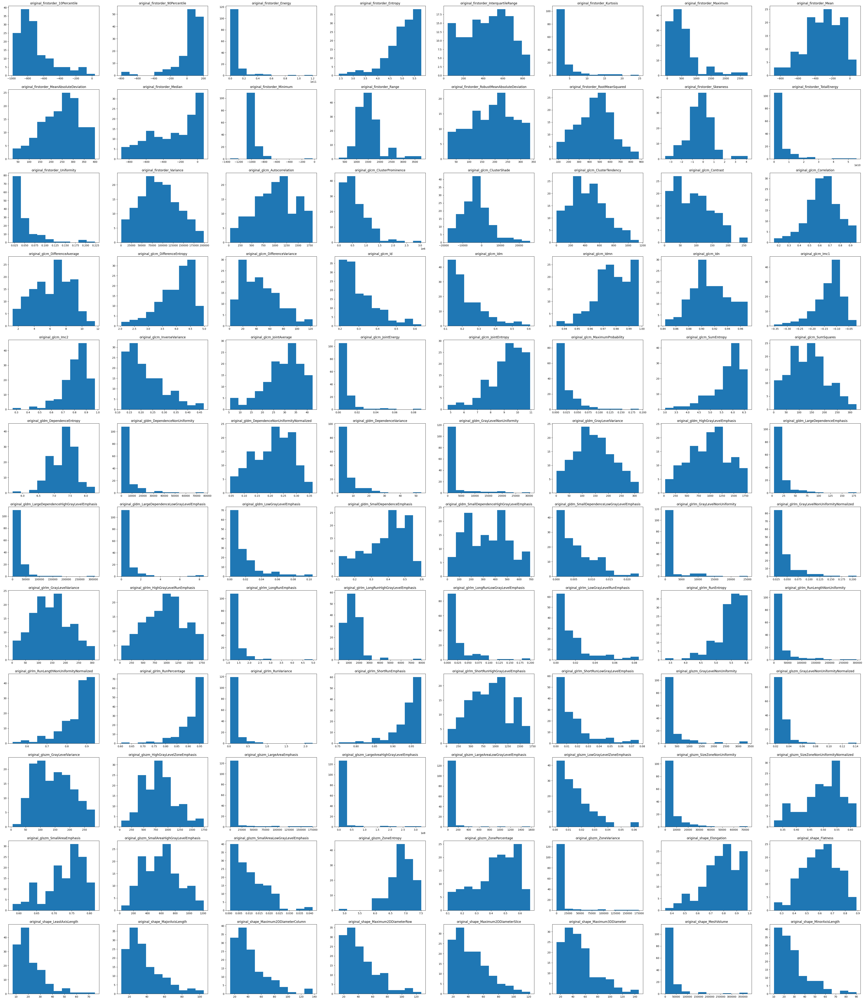

In [ ]:
# mean and standard deviation
from scipy.stats import norm
fig, m_axs = plt.subplots(12, 8, figsize=(60, 70))
for c_ax, c_var in zip(m_axs.flatten(), feature_names):
    mu, std = norm.fit(clean_df[c_var].values)
    # Plot the PDF.
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    c_ax.hist(clean_df[c_var].values, bins=10)
    c_ax.set_title('\n'.join(c_var.split(' ')))
# fig.savefig('all_metrics.png')

# Modeling

#### RF

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
import builtins
dict = builtins.dict
def RF_CV(X_std,y):
	RF_xy_trainlist = []
	RF_xy_testlist = []
	# dataset
	X, y = X_std, y
	# configure the cross-validation procedure
	cv_outer = KFold(n_splits=3, shuffle=True, random_state=1)
        
	# enumerate splits
	outer_results = list()
	i = 0
	sgkf = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
	for train_ix, test_ix in sgkf.split(X,y):
		# split data
		# X_train, X_test = X[train_ix, :], X[test_ix, :]
		# y_train, y_test = y[train_ix], y[test_ix]
		X_train, X_test = X[train_ix], X[test_ix]
		y_train, y_test = y[train_ix], y[test_ix]
		RF_xy_trainlist.append([X_train,y_train ])
		RF_xy_testlist.append([X_test, y_test])

		# configure the cross-validation procedure
		cv_inner = KFold(n_splits=5, shuffle=True, random_state=1)
		# define the model
		model = RandomForestClassifier(random_state=1)
			# define search space
		space = dict()
		# space["max_features"] = ['sqrt', 'log2']
		space['n_estimators'] = [10, 100, 500]
		space['min_samples_leaf'] = [5,10,15]
		space['criterion'] = ["gini","entropy"]
		# space['max_features'] = [10,15,20]
			
			# define search
		search = GridSearchCV(model, space, scoring='accuracy', cv=cv_inner, refit=True)
		# execute search
		result = search.fit(X_train, y_train)
		# get the best performing model fit on the whole training set
		best_model = result.best_estimator_
		# evaluate model on the hold out dataset
		yhat = best_model.predict(X_test)
		# evaluate the model
		acc = accuracy_score(y_test, yhat)
		# store the result
		outer_results.append(acc)
		# report progress
		print(i,'>acc=%.3f, est=%.3f, cfg=%s' % (acc, result.best_score_, result.best_params_))
		i+=1
	# summarize the estimated performance of the model
	print('Accuracy: %.3f (%.3f)' % (statistics.mean(outer_results), statistics.stdev(outer_results)))
	return RF_xy_testlist,RF_xy_trainlist
def RandomForest_ROC(X_std, y ,criterion,n_estimators,min_samples_leaf):
        forest = RandomForestClassifier(bootstrap=True,criterion=criterion,oob_score=True,n_jobs=-1,n_estimators=n_estimators,min_samples_leaf=min_samples_leaf,random_state=1,class_weight='balanced')
        cv = StratifiedKFold(n_splits=10)
        classifier = forest
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        i = 0
        for train, test in cv.split(X_std, y):
            probas_ = classifier.fit(X_std[train], y[train]).predict_proba(X_std[test])
            # Compute ROC curve and area the curve
            fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])
            tprs.append(interp(mean_fpr, fpr, tpr))
            tprs[-1][0] = 0.0
            roc_auc = auc(fpr, tpr)
            aucs.append(roc_auc)
            #plt.plot(fpr, tpr, lw=1, alpha=0.3,label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
            i += 1
        return tprs,aucs,mean_fpr,forest

#### SVM

In [ ]:

def SVM_CV(X_std, y):
		# dataset
		X, y = X_std, y
		xy_trainlist = []
		xy_testlist = []
		# configure the cross-validation procedure
		cv_outer = KFold(n_splits=20, shuffle=True, random_state=1)
		# enumerate splits
		outer_results = list()
		i = 0
		sgkf = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
		for train_ix, test_ix in sgkf.split(X,y):
			# split data
			# X_train, X_test = X[train_ix, :], X[test_ix, :]
			# y_train, y_test = y[train_ix], y[test_ix]
			X_train, X_test = X[train_ix], X[test_ix]
			y_train, y_test = y[train_ix], y[test_ix]
			xy_trainlist.append([X_train,y_train ])
			xy_testlist.append([X_test, y_test])
			# configure the cross-validation procedure
			cv_inner = KFold(n_splits=5, shuffle=True, random_state=1)
			# define the model
			model = SVC(random_state=1)
			# define search space
			space = dict()
			space['kernel'] = ["poly", "rbf", "sigmoid"]
			# space['gamma'] = ["scale","auto"]
			space['C'] = [0.1,1.0,5]
			space["decision_function_shape"] = ['ovo','ovr']
			
			# define search
			search = GridSearchCV(model, space, scoring='accuracy', cv=cv_inner, refit=True,return_train_score=True)
			# execute search
			result = search.fit(X_train, y_train)
			# get the best performing model fit on the whole training set
			best_model = result.best_estimator_
			# evaluate model on the hold out dataset
			yhat = best_model.predict(X_test)
			# evaluate the model
			acc = accuracy_score(y_test, yhat)
			# store the result
			outer_results.append(acc)
			# report progress
			print(i,'>acc=%.3f, est=%.3f, cfg=%s' % (acc, result.best_score_, result.best_params_))
			i+=1
		# summarize the estimated performance of the model
		print('Accuracy: %.3f (%.3f)' % (mean(outer_results), np.std(outer_results)))
		return xy_testlist , xy_trainlist
def SVM_ROC(X_std, y,C,kernel,decision_function_shape):
    svm = SVC(kernel=kernel, C=C,shrinking=False,probability=True,decision_function_shape=decision_function_shape,random_state=1)
    cv = StratifiedKFold(n_splits=10)
    classifier = svm
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    i = 0
    for train, test in cv.split(X_std, y):
        probas_ = classifier.fit(X_std[train], y[train]).predict_proba(X_std[test])
        # clf.score(X_test, y_test)
        # Compute ROC curve and area the curve
        fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])
        tprs.append(interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        #plt.plot(fpr, tpr, lw=1, alpha=0.3,label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
        i += 1
    return tprs,aucs,mean_fpr,svm

def f_importances(coef, names):
    imp = coef
    imp,names = zip(*sorted(zip(imp,names)))
    plt.barh(range(len(names)), imp, align='center')
    plt.yticks(range(len(names)), names)
    plt.show()

#### without Feature Selection

In [ ]:
def all_features():
        dataset_all_features = data.copy()
        class_mapping = {label: idx for idx, label in enumerate(np.unique(dataset_all_features['survival_status']))}
        class_mapping
        dataset_all_features['survival_status'] = dataset_all_features['survival_status'].map(class_mapping)
        y = LabelEncoder().fit_transform(dataset_all_features['survival_status'].values)
        X = dataset_all_features.iloc[:,0:len(dataset_all_features.columns)-3].values
        print(y.shape)
        print(X.shape)
        feat_labels = dataset_all_features.columns[0:len(dataset_all_features.columns)-3]
        return X,y,dataset_all_features

##### Random Forest

In [ ]:
X,y,dataset_all_features  = all_features()
stdsc = StandardScaler()
X_std = stdsc.fit_transform(X)
print("X shape",X_std.shape)
RF_xy_testlist_1,RF_xy_trainlist_1 = RF_CV(X_std,y)

(137,)
(137, 100)
X shape (137, 100)
0 >acc=0.643, est=0.675, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
1 >acc=0.500, est=0.618, cfg={'criterion': 'entropy', 'min_samples_leaf': 10, 'n_estimators': 500}
2 >acc=0.786, est=0.594, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
3 >acc=0.714, est=0.635, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
4 >acc=0.571, est=0.700, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 10}
5 >acc=0.571, est=0.651, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 100}
6 >acc=0.500, est=0.676, cfg={'criterion': 'entropy', 'min_samples_leaf': 5, 'n_estimators': 500}
7 >acc=0.538, est=0.669, cfg={'criterion': 'entropy', 'min_samples_leaf': 10, 'n_estimators': 500}
8 >acc=0.769, est=0.614, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
9 >acc=0.538, est=0.646, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}

(137,)
(137, 100)
X shape (137, 100)
0 >acc=0.643, est=0.675, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
1 >acc=0.429, est=0.617, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 100}
2 >acc=0.786, est=0.594, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
3 >acc=0.714, est=0.635, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
4 >acc=0.571, est=0.700, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 10}
5 >acc=0.571, est=0.651, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 100}
6 >acc=0.429, est=0.667, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 10}
7 >acc=0.538, est=0.653, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 100}
8 >acc=0.769, est=0.614, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
9 >acc=0.538, est=0.646, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
10 >acc=0.786, est=0.585, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 500}
11 >acc=0.571, est=0.633, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
12 >acc=0.571, est=0.633, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
13 >acc=0.571, est=0.625, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 100}
14 >acc=0.500, est=0.643, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 500}
15 >acc=0.643, est=0.635, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
16 >acc=0.500, est=0.650, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 500}
17 >acc=0.308, est=0.596, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 10}
18 >acc=0.692, est=0.645, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 100}
19 >acc=0.615, est=0.614, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 100}
Accuracy: 0.587 (0.125)

The optimal settings that we selected are 


11 >acc=0.857, est=0.646, cfg={'criterion': 'gini', 'min_samples_leaf': 20, 'n_estimators': 100}

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and w

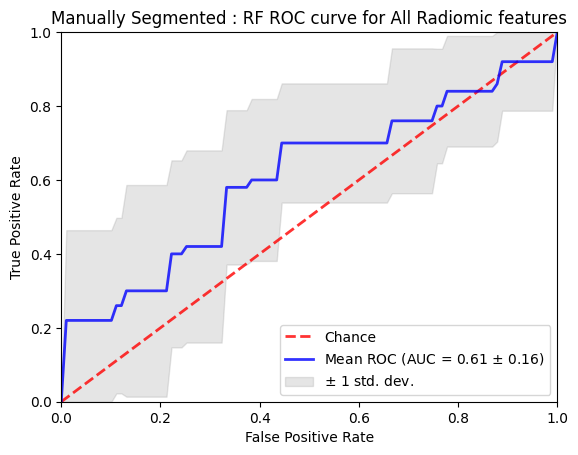

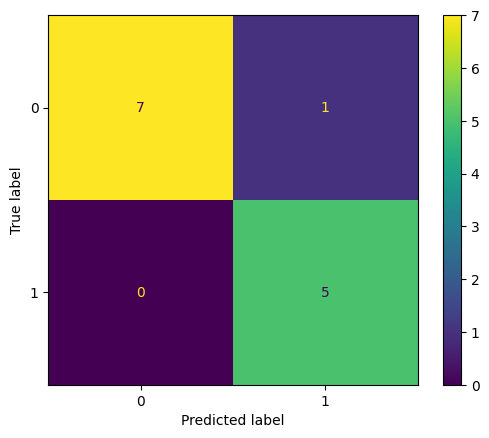

In [ ]:
tprs,aucs,mean_fpr,forest = RandomForest_ROC(X_std,y,criterion='entropy',n_estimators=100,min_samples_leaf=5)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented : RF ROC curve for All Radiomic features')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(forest, RF_xy_testlist_1[8][0], RF_xy_testlist_1[8][1])

Text(0.5, 0, 'Permutation Importance')

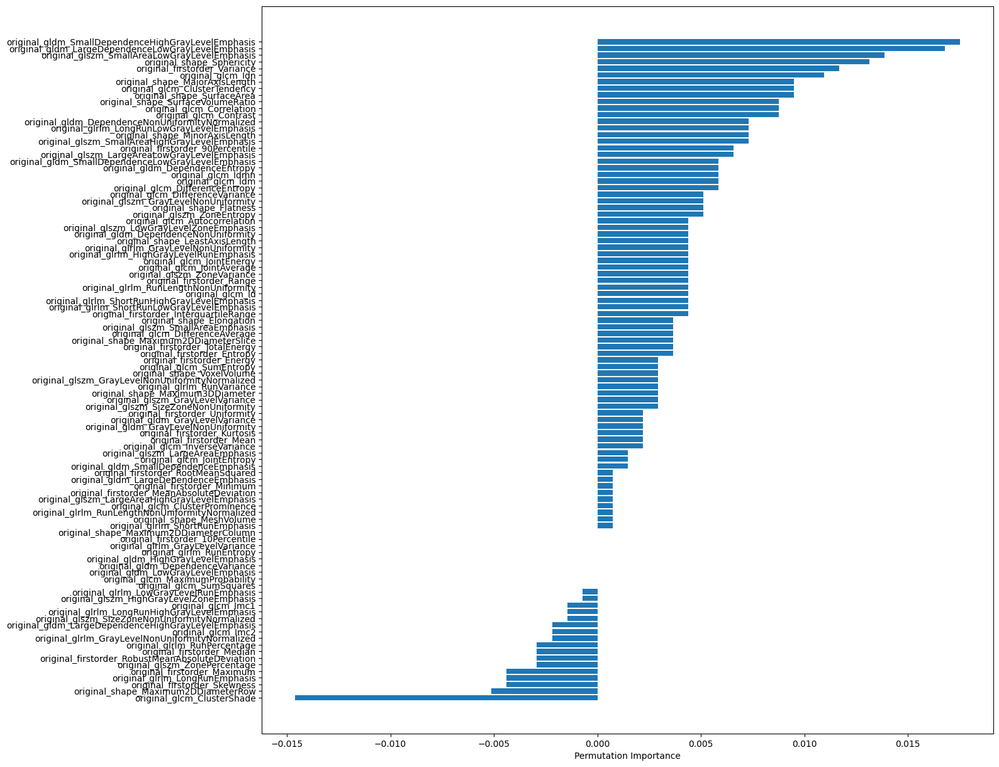

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(forest,X_std, y, n_repeats=10,random_state=0)

features  =np.array(list(dataset_all_features.columns[:-3])) 
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(15,15))
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")


Text(0.5, 0, 'Permutation Importance')

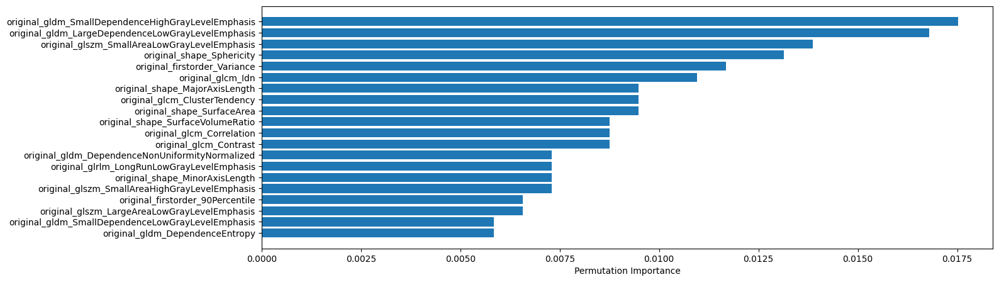

In [ ]:
plt.figure(figsize=(15,5))
plt.barh(features[sorted_idx[-20:]], result.importances_mean[sorted_idx[-20:]])
plt.xlabel("Permutation Importance")

##### SVM

In [ ]:
X,y,dataset_all_features  = all_features()
stdsc = StandardScaler()
X_std = stdsc.fit_transform(X)
print("X shape",X_std.shape)
xy_testlist_1,xy_trainlist_1 = SVM_CV(X_std,y)

(137,)
(137, 100)
X shape (137, 100)
0 >acc=0.786, est=0.643, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
1 >acc=0.714, est=0.674, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
2 >acc=0.643, est=0.635, cfg={'C': 0.1, 'decision_function_shape': 'ovo', 'kernel': 'rbf'}
3 >acc=0.571, est=0.659, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
4 >acc=0.643, est=0.676, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
5 >acc=0.643, est=0.683, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
6 >acc=0.500, est=0.707, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
7 >acc=0.615, est=0.669, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
8 >acc=0.769, est=0.654, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
9 >acc=0.462, est=0.678, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
10 >acc=0.643, est=0.634, cfg={'C': 0.1, 'decision_

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and w

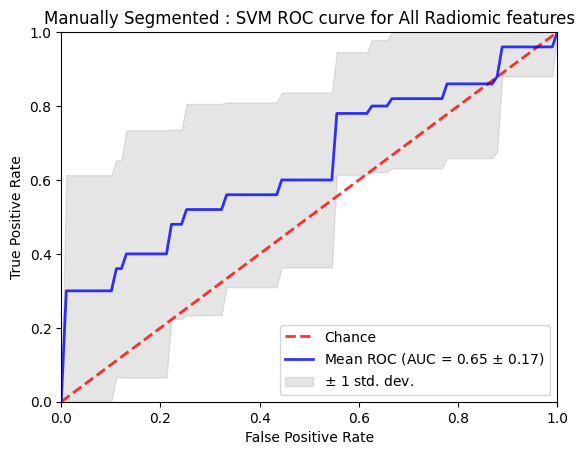

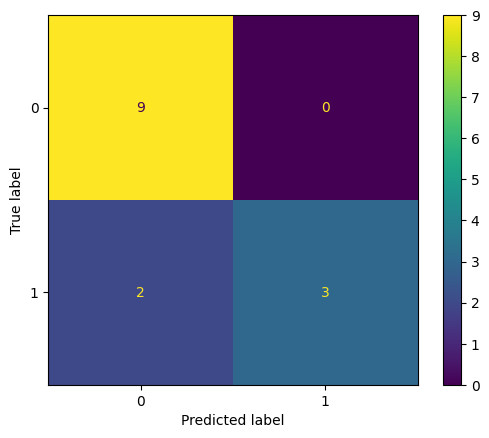

In [ ]:
tprs,aucs,mean_fpr,svm = SVM_ROC(X_std,y , C= 1, kernel = 'poly' , decision_function_shape = 'ovo')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented : SVM ROC curve for All Radiomic features')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(svm, xy_testlist_1[1][0], xy_testlist_1[1][1])

Text(0.5, 0, 'Permutation Importance')

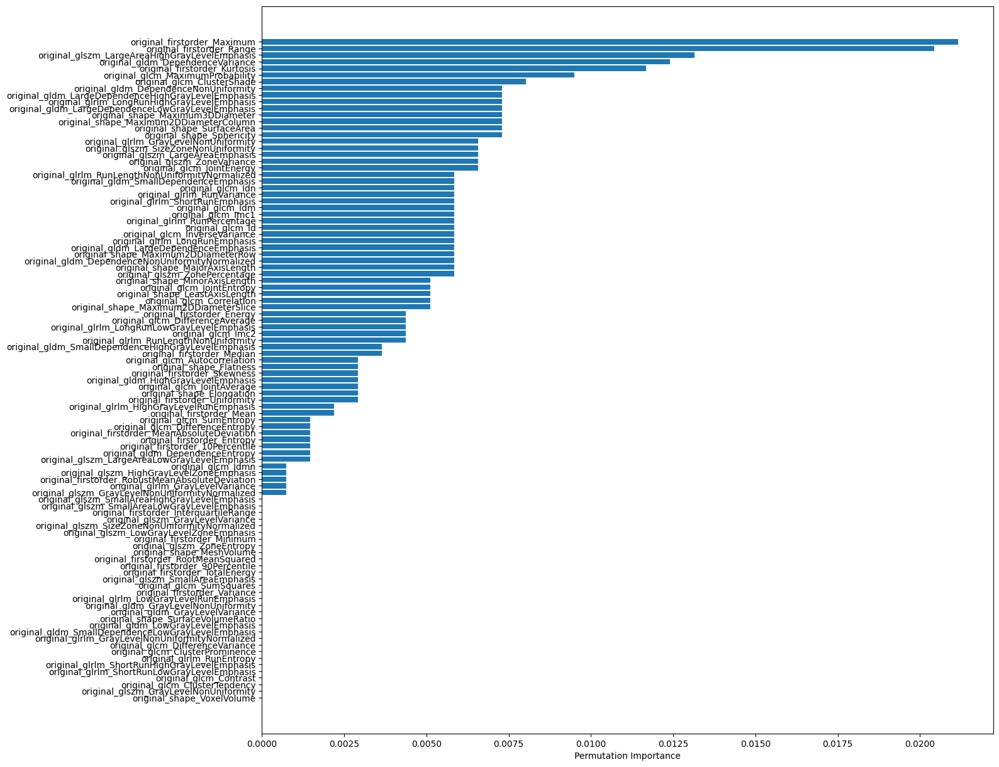

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(svm,X_std,y, n_repeats=10,random_state=0)
feat  = list(dataset_all_features.columns[:-3])
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(15,15))
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

Text(0.5, 0, 'Permutation Importance')

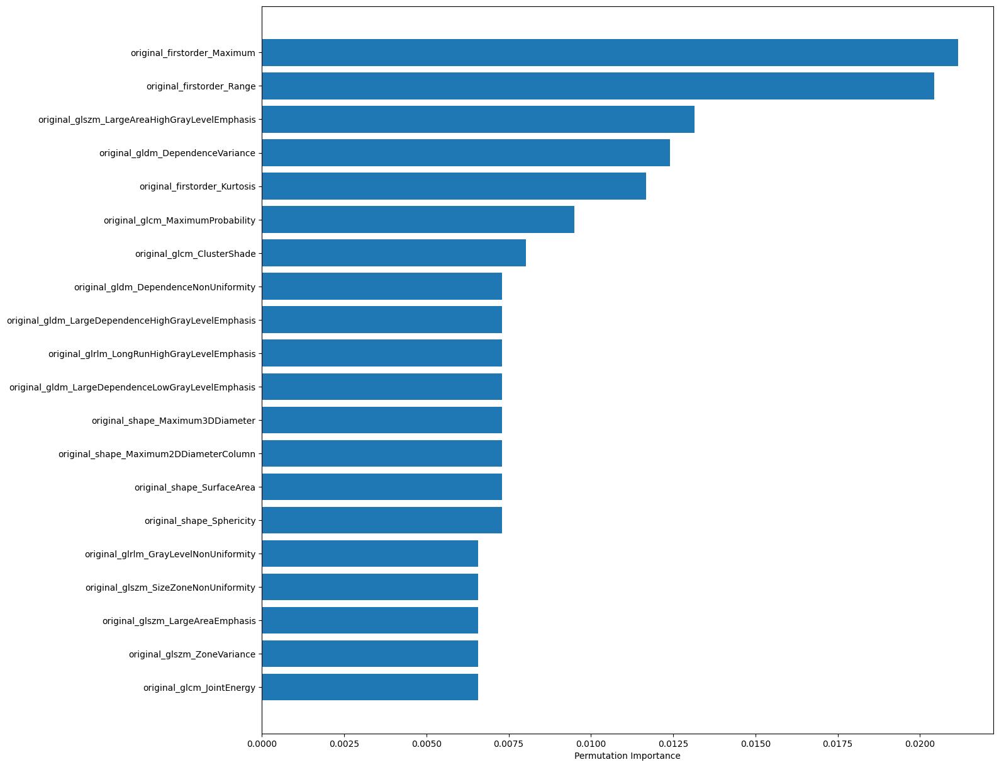

In [ ]:
plt.figure(figsize=(15,15))
plt.barh(features[sorted_idx[-20:]], result.importances_mean[sorted_idx[-20:]])
plt.xlabel("Permutation Importance")

#### Feature Selection with threshold

After analysing the features from the maps above, we will now clean the dataframe with highly correlated variable since they will cause strong assumptions.
Now to do so , we have different techniques , proposed following

In [ ]:
from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
from scipy.stats import spearmanr

from sklearn.datasets import load_breast_cancer
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
# data = load_breast_cancer()
X,y,dataset_all_features  = all_features()
stdsc = StandardScaler()
X_std = stdsc.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_std, y, random_state=42)

clf = RandomForestClassifier(criterion='gini',n_estimators=100,min_samples_leaf=5, random_state=42)
clf.fit(X_train, y_train)
print("Accuracy on test data: {:.2f}".format(clf.score(X_test, y_test)))

(137,)
(137, 100)
Accuracy on test data: 0.74


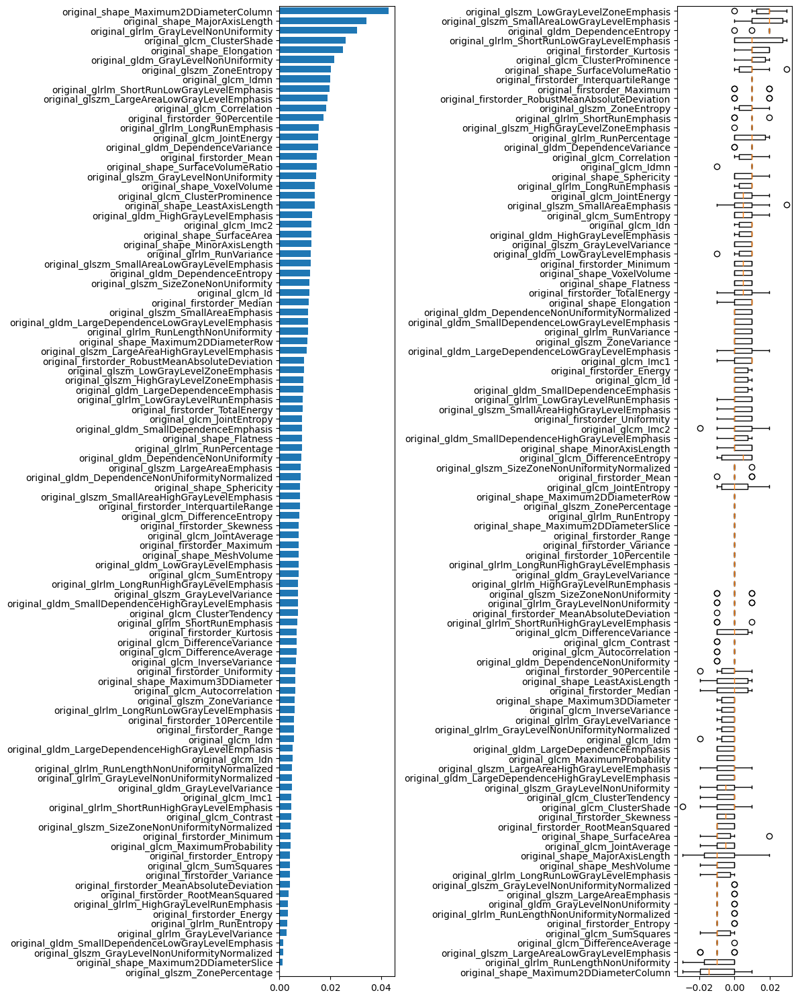

In [ ]:
result = permutation_importance(clf, X_train, y_train, n_repeats=10, random_state=42)
perm_sorted_idx = result.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5




fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 15))
ax1.barh(tree_indices, clf.feature_importances_[tree_importance_sorted_idx], height=0.7)
ax1.set_yticks(tree_indices)
sorted_feature_names = feature_names.copy()
for i,idx in enumerate(tree_importance_sorted_idx):
      # print(i)
      # print(idx)
      sorted_feature_names[i] = feature_names[idx]
ax1.set_yticklabels(sorted_feature_names)
ax1.set_ylim((0, len(clf.feature_importances_)))
sorted_feature_names = feature_names.copy()
for i,idx in enumerate(perm_sorted_idx):
      sorted_feature_names[i] = feature_names[idx]
ax2.boxplot(
    result.importances[perm_sorted_idx].T,
    vert=False,
    labels=sorted_feature_names,
)
fig.tight_layout()
plt.show()

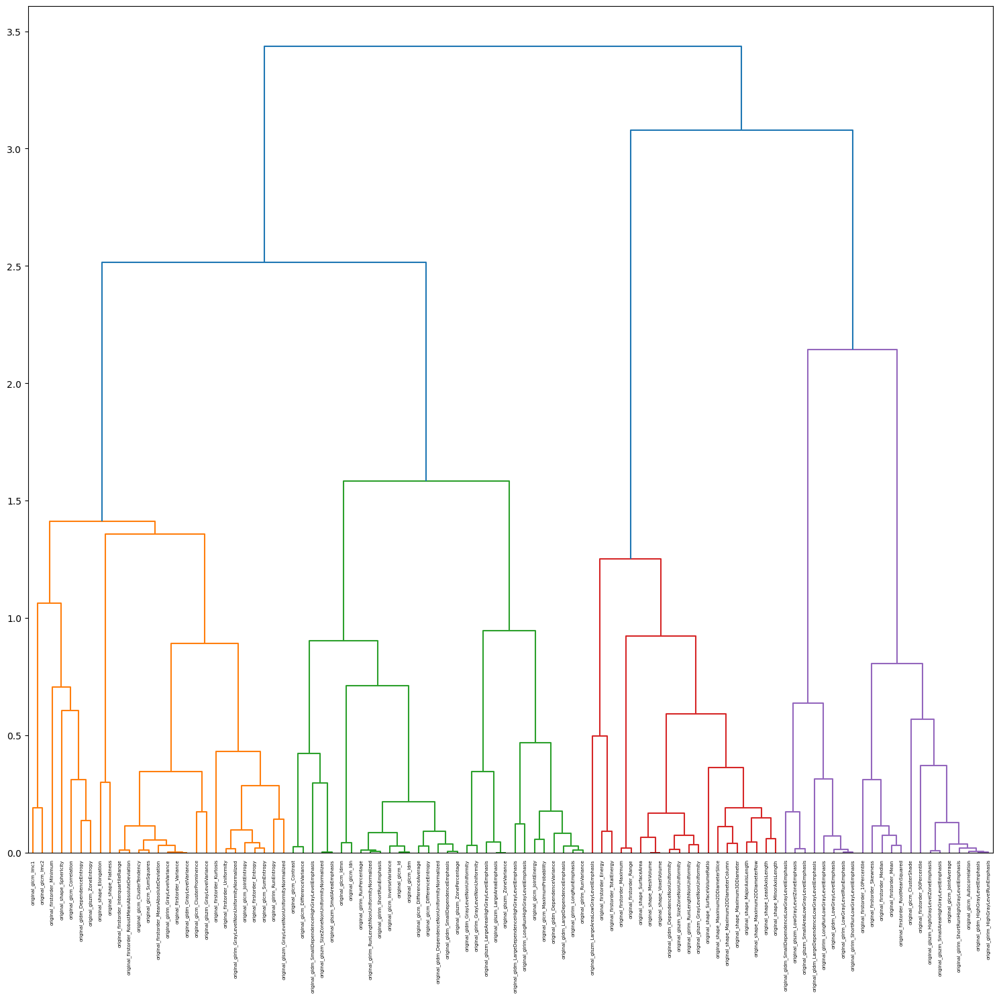

In [ ]:

fig, ax1, = plt.subplots(figsize=(15, 15))
d = pandas.DataFrame(data=samples, columns=feature_names)
# corr = spearmanr(samples).correlation
corr = d.corr()

# Ensure the correlation matrix is symmetric
# corr = (corr + corr.T) / 2
# np.fill_diagonal(corr, 1)

# We convert the correlation matrix to a distance matrix before performing
# hierarchical clustering using Ward's linkage.
distance_matrix = 1 - np.abs(corr)
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=d.columns, ax=ax1, leaf_rotation=90
)
dendro_idx = np.arange(0, len(dendro["ivl"]))
fig.tight_layout()
plt.show()

In [ ]:
cluster_ids = hierarchy.fcluster(dist_linkage, 0.5, criterion="distance")
cluster_id_to_feature_ids = defaultdict(list)
for idx, cluster_id in enumerate(cluster_ids):
    cluster_id_to_feature_ids[cluster_id].append(idx)
    
selected_features = [v[0] for v in cluster_id_to_feature_ids.values()]
print(selected_features)
X_train_sel = X_train[:, selected_features]
X_test_sel = X_test[:, selected_features]

clf_sel = RandomForestClassifier(criterion='gini',n_estimators=100,min_samples_leaf=5, random_state=42)
clf_sel.fit(X_train_sel, y_train)
print(
    "Accuracy on test data with features removed: {:.2f}".format(
        clf_sel.score(X_test_sel, y_test)
    )
)


[0, 1, 2, 3, 4, 6, 10, 20, 22, 23, 24, 29, 31, 35, 41, 44, 49, 53, 86, 88, 96]
Accuracy on test data with features removed: 0.63


[0, 1, 2, 3, 4, 6, 22, 23, 31, 49, 86]
Accuracy on test data with features removed: 0.57

In [ ]:
def threshold_permutation_feature_selection(data,threshold):
    data_with_selected_Features1 = data.copy()
    cluster_ids = hierarchy.fcluster(dist_linkage, threshold, criterion="distance")
    cluster_id_to_feature_ids = defaultdict(list)
    for idx, cluster_id in enumerate(cluster_ids):
        cluster_id_to_feature_ids[cluster_id].append(idx)
    selected_features = [v[0] for v in cluster_id_to_feature_ids.values()]
    columns = list(data_with_selected_Features1.columns)
    print(selected_features)
    res_list = [columns[i] for i in selected_features]
    res_list += ["labels","Patient_id","survival_status"]
    data_with_selected_Features1.drop(columns=[col for col in data_with_selected_Features1 if col not in res_list], inplace=True)
    return data_with_selected_Features1

In [ ]:
threshold_permutation_feature_selection(data,threshold=0.5)

[0, 1, 2, 3, 4, 6, 10, 20, 22, 23, 24, 29, 31, 35, 41, 44, 49, 53, 86, 88, 96]


,original_firstorder_10Percentile,original_firstorder_90Percentile,original_firstorder_Energy,original_firstorder_Entropy,original_firstorder_InterquartileRange,original_firstorder_Maximum,original_firstorder_Minimum,original_glcm_ClusterShade,original_glcm_Contrast,original_glcm_Correlation,...,original_gldm_DependenceNonUniformity,original_gldm_GrayLevelNonUniformity,original_gldm_LargeDependenceLowGrayLevelEmphasis,original_gldm_SmallDependenceLowGrayLevelEmphasis,original_shape_Elongation,original_shape_LeastAxisLength,original_shape_Sphericity,labels,Patient_id,survival_status
0,-443.0,41.0,1.552086e+08,4.496936,282.00,154.0,-812.0,-2285.722545,33.849235,0.619160,...,415.230232,172.271791,0.029890,0.001690,0.696204,8.917224,0.631682,0,R01-001,Alive
1,-386.1,38.0,8.860778e+07,4.192986,183.75,144.0,-829.0,-1550.034184,41.332055,0.381719,...,323.025116,176.652093,0.019846,0.001968,0.731036,12.423493,0.699161,0,R01-002,Alive
2,-324.4,106.0,4.174656e+07,4.332427,149.00,290.0,-815.0,-1272.245157,54.026042,0.213314,...,215.675227,97.021148,0.015880,0.001531,0.720787,11.068083,0.759558,0,R01-003,Alive
3,-501.2,148.0,1.084852e+08,4.833568,244.00,366.0,-1024.0,-5332.149814,86.624430,0.392843,...,322.310924,80.040724,0.008517,0.001468,0.627508,8.305906,0.576187,0,R01-004,Alive
4,-154.0,51.0,2.035543e+08,3.365276,59.00,391.0,-783.0,-592.882657,13.224001,0.438770,...,1314.519158,2511.602466,0.050188,0.000402,0.782424,18.347448,0.681077,1,R01-005,Dead
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,-855.0,114.0,3.098198e+09,5.647720,691.00,827.0,-1024.0,-7378.929982,155.327495,0.638289,...,3523.983317,275.104427,0.558159,0.010996,0.627030,16.998713,0.573403,0,R01-141,Alive
133,-717.0,94.0,3.852615e+09,5.490919,530.00,467.0,-1023.0,-4279.622271,81.803150,0.705692,...,6012.625386,546.402791,0.013118,0.002038,0.700707,28.365583,0.592916,0,R01-142,Alive
134,-838.0,37.0,2.283232e+09,5.456589,626.00,495.0,-1024.0,2998.089218,135.164472,0.643558,...,2052.085381,183.808069,0.094926,0.008086,0.971502,13.385666,0.516694,0,R01-144,Alive
135,-913.0,72.0,2.706531e+10,5.227012,780.00,1350.0,-1024.0,25788.848345,77.106222,0.855569,...,10721.690091,2205.816746,0.265266,0.005540,0.905975,30.107196,0.492914,0,R01-145,Alive


##### Random Forest

In [ ]:
RF_xy_testlist_main_2 = []
RF_xy_trainlist_main_2 = [] 
X_std_list = []
for thres in [0.5,1,1.5]:
        df_drop = threshold_permutation_feature_selection(data,thres)
        print("Selected features are " , df_drop.columns)
        class_mapping = {label: idx for idx, label in enumerate(np.unique(df_drop['survival_status']))}
        df_drop['survival_status'] = df_drop['survival_status'].map(class_mapping)
        y = LabelEncoder().fit_transform(df_drop['survival_status'].values)
        X = df_drop.iloc[:,0:len(df_drop.columns)-3].values
        print("Y shape" , y.shape)
        print("X shape" , X.shape)
        feat_labels = df_drop.columns[0:len(df_drop.columns)-3]
        stdsc = StandardScaler()
        X_std = stdsc.fit_transform(X)
        RF_xy_testlist,RF_xy_trainlist = RF_CV(X_std,y)
        RF_xy_testlist_main_2.append(RF_xy_testlist)
        RF_xy_trainlist_main_2.append(RF_xy_trainlist)
        X_std_list.append(X_std)

[0, 1, 2, 3, 4, 6, 10, 20, 22, 23, 24, 29, 31, 35, 41, 44, 49, 53, 86, 88, 96]
Selected features are  Index(['original_firstorder_10Percentile', 'original_firstorder_90Percentile',
       'original_firstorder_Energy', 'original_firstorder_Entropy',
       'original_firstorder_InterquartileRange', 'original_firstorder_Maximum',
       'original_firstorder_Minimum', 'original_glcm_ClusterShade',
       'original_glcm_Contrast', 'original_glcm_Correlation',
       'original_glcm_DifferenceAverage', 'original_glcm_Idmn',
       'original_glcm_Imc1', 'original_glcm_JointEnergy',
       'original_gldm_DependenceNonUniformity',
       'original_gldm_GrayLevelNonUniformity',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'original_shape_Elongation', 'original_shape_LeastAxisLength',
       'original_shape_Sphericity', 'labels', 'Patient_id', 'survival_status'],
      dtype='object')
Y shape (137,)
X shape (137, 21)

0 >acc=0.571, est=0.667, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 10}
1 >acc=0.571, est=0.626, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 100}
2 >acc=0.786, est=0.619, cfg={'criterion': 'entropy', 'min_samples_leaf': 10, 'n_estimators': 10}
3 >acc=0.429, est=0.651, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 500}
4 >acc=0.643, est=0.693, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
5 >acc=0.643, est=0.643, cfg={'criterion': 'entropy', 'min_samples_leaf': 15, 'n_estimators': 100}
6 >acc=0.571, est=0.660, cfg={'criterion': 'entropy', 'min_samples_leaf': 10, 'n_estimators': 10}
7 >acc=0.615, est=0.677, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 100}
8 >acc=0.615, est=0.654, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
9 >acc=0.615, est=0.654, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
10 >acc=0.714, est=0.610, cfg={'criteri

The optimal settings that we selected are 


15 >acc=0.714, est=0.651, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 500}

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and w

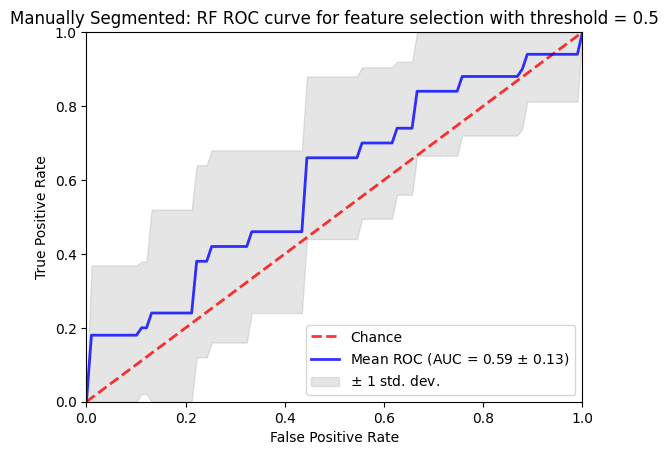

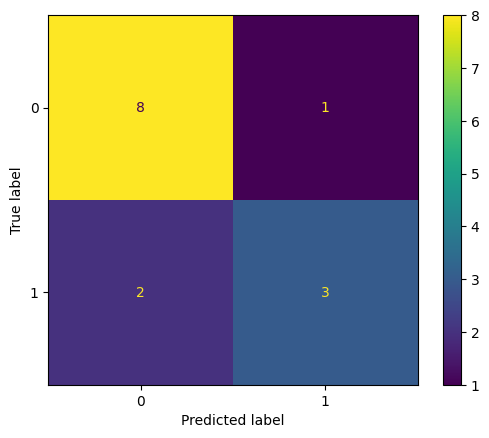

In [ ]:
tprs,aucs,mean_fpr,forest = RandomForest_ROC(X_std_list[0], y, criterion='gini',n_estimators=500,min_samples_leaf=10)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: RF ROC curve for feature selection with threshold = 0.5')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(forest, RF_xy_testlist_main_2[0][15][0], RF_xy_testlist_main_2[0][15][1])

Text(0.5, 0, 'Permutation Importance')

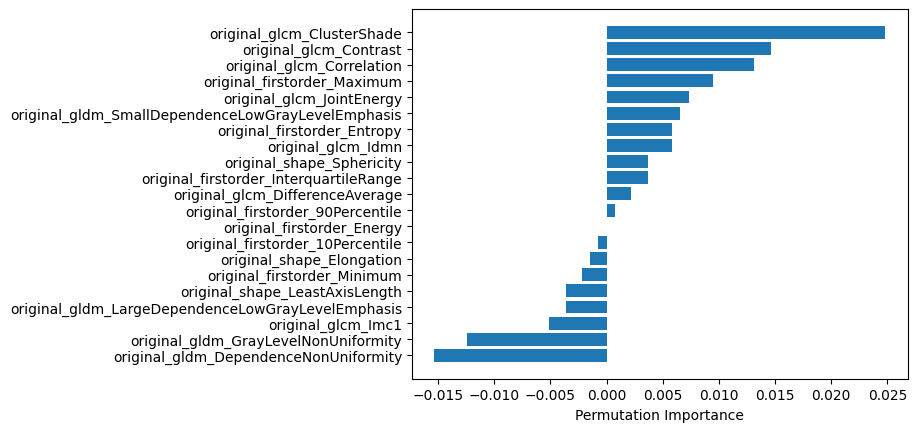

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(forest,X_std_list[0], y, n_repeats=10,random_state=0)
feat  = ['original_firstorder_10Percentile', 'original_firstorder_90Percentile',
       'original_firstorder_Energy', 'original_firstorder_Entropy',
       'original_firstorder_InterquartileRange', 'original_firstorder_Maximum',
       'original_firstorder_Minimum', 'original_glcm_ClusterShade',
       'original_glcm_Contrast', 'original_glcm_Correlation',
       'original_glcm_DifferenceAverage', 'original_glcm_Idmn',
       'original_glcm_Imc1', 'original_glcm_JointEnergy',
       'original_gldm_DependenceNonUniformity',
       'original_gldm_GrayLevelNonUniformity',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'original_shape_Elongation', 'original_shape_LeastAxisLength',
       'original_shape_Sphericity']
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

13 >acc=0.714, est=0.600, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 500}


/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and w

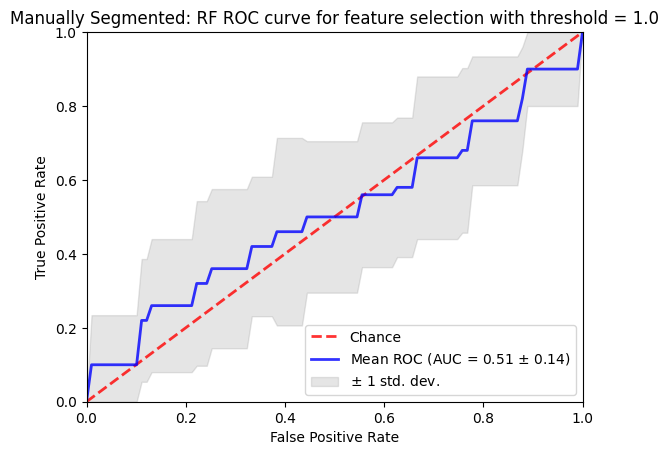

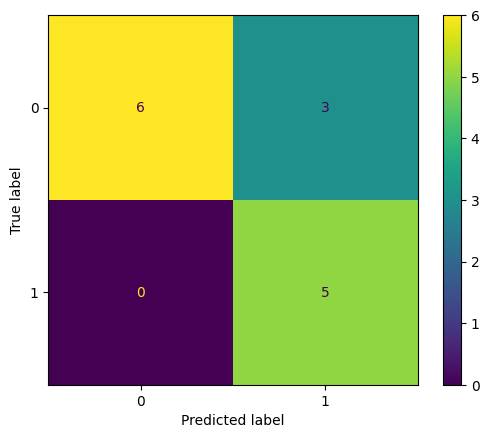

In [ ]:
tprs,aucs,mean_fpr,forest = RandomForest_ROC(X_std_list[1], y, criterion='gini',n_estimators=500,min_samples_leaf=15)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: RF ROC curve for feature selection with threshold = 1.0')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(forest, RF_xy_testlist_main_2[1][13][0], RF_xy_testlist_main_2[1][13][1])

Text(0.5, 0, 'Permutation Importance')

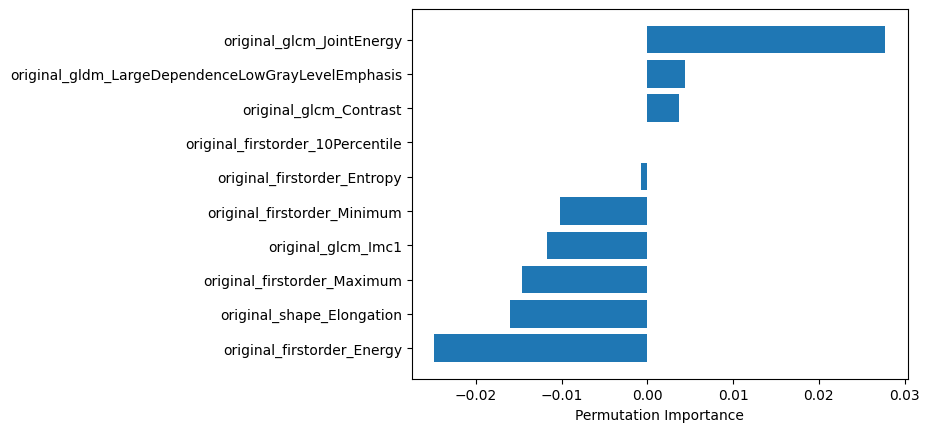

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(forest,X_std_list[1], y, n_repeats=10,random_state=0)
feat = ['original_firstorder_10Percentile', 'original_firstorder_Energy',
       'original_firstorder_Entropy', 'original_firstorder_Maximum',
       'original_firstorder_Minimum', 'original_glcm_Contrast',
       'original_glcm_Imc1', 'original_glcm_JointEnergy',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_shape_Elongation']
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

13 >acc=0.714, est=0.600, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}


14 >acc=0.714, est=0.651, cfg={'criterion': 'entropy', 'min_samples_leaf': 5, 'n_estimators': 10}



15 >acc=0.714, est=0.618, cfg={'criterion': 'entropy', 'min_samples_leaf': 10, 'n_estimators': 100}

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and w

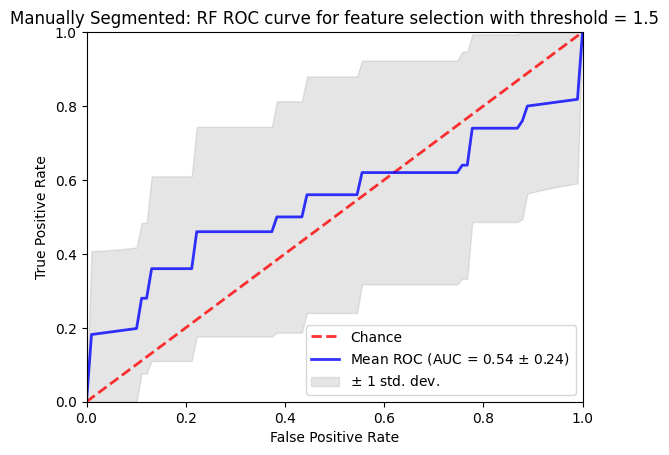

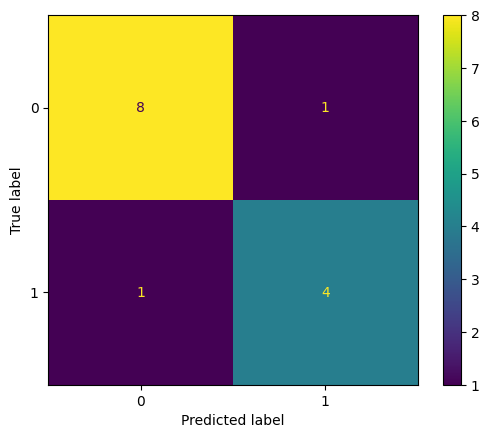

In [ ]:
tprs,aucs,mean_fpr,forest = RandomForest_ROC(X_std_list[2], y, criterion='entropy',n_estimators=10,min_samples_leaf=5)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: RF ROC curve for feature selection with threshold = 1.5')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(forest, RF_xy_testlist_main_2[2][14][0], RF_xy_testlist_main_2[2][14][1])

Text(0.5, 0, 'Permutation Importance')

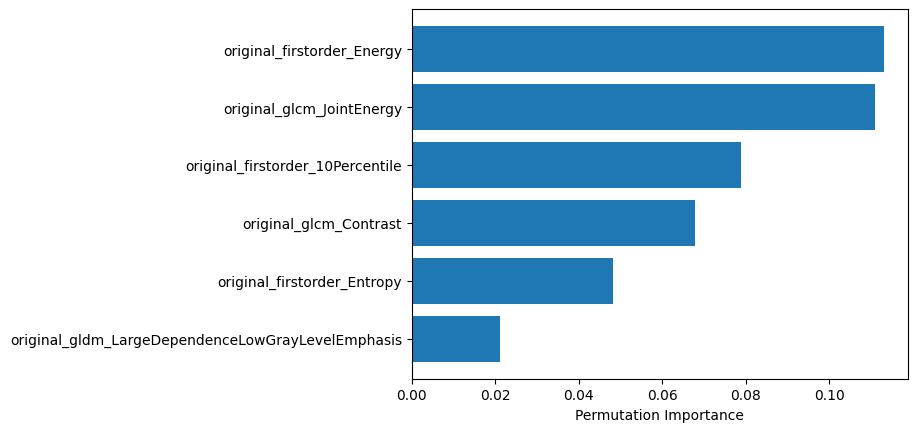

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(forest,X_std_list[2], y, n_repeats=10,random_state=0)
feat = ['original_firstorder_10Percentile', 'original_firstorder_Energy',
       'original_firstorder_Entropy', 'original_glcm_Contrast',
       'original_glcm_JointEnergy',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',]
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

##### SVM

In [ ]:
xy_testlist_main_2 = []
xy_trainlist_main_2 = [] 
X_std_list = []
for thres in [0.5,1,1.5]:
        df_drop = threshold_permutation_feature_selection(data,thres)
        print("Selected features are " , df_drop.columns)
        class_mapping = {label: idx for idx, label in enumerate(np.unique(df_drop['survival_status']))}
        class_mapping
        df_drop['survival_status'] = df_drop['survival_status'].map(class_mapping)
        y = LabelEncoder().fit_transform(df_drop['survival_status'].values)
        X = df_drop.iloc[:,0:len(df_drop.columns)-3].values
        print("Y shape" , y.shape)
        print("X shape" , X.shape)
        feat_labels = df_drop.columns[0:len(df_drop.columns)-3]
        stdsc = StandardScaler()
        X_std = stdsc.fit_transform(X)
        xy_testlist,xy_trainlist = SVM_CV(X_std,y)
        xy_testlist_main_2.append(xy_testlist)
        xy_trainlist_main_2.append(xy_trainlist)
        X_std_list.append(X_std)

[0, 1, 2, 3, 4, 6, 10, 20, 22, 23, 24, 29, 31, 35, 41, 44, 49, 53, 86, 88, 96]
Selected features are  Index(['original_firstorder_10Percentile', 'original_firstorder_90Percentile',
       'original_firstorder_Energy', 'original_firstorder_Entropy',
       'original_firstorder_InterquartileRange', 'original_firstorder_Maximum',
       'original_firstorder_Minimum', 'original_glcm_ClusterShade',
       'original_glcm_Contrast', 'original_glcm_Correlation',
       'original_glcm_DifferenceAverage', 'original_glcm_Idmn',
       'original_glcm_Imc1', 'original_glcm_JointEnergy',
       'original_gldm_DependenceNonUniformity',
       'original_gldm_GrayLevelNonUniformity',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'original_shape_Elongation', 'original_shape_LeastAxisLength',
       'original_shape_Sphericity', 'labels', 'Patient_id', 'survival_status'],
      dtype='object')
Y shape (137,)
X shape (137, 21)

The optimal settings that we selected are 


0 >acc=0.786, est=0.659, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}


1 >acc=0.643, est=0.683, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}


2 >acc=0.786, est=0.643, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}

13 >acc=0.714, est=0.657, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}

14 >acc=0.714, est=0.683, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and w

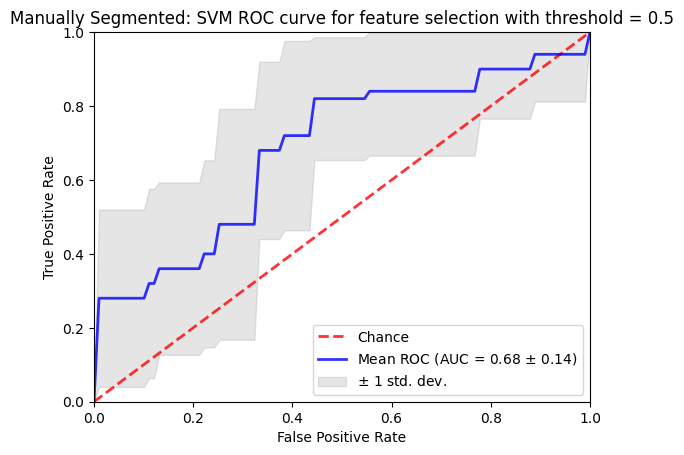

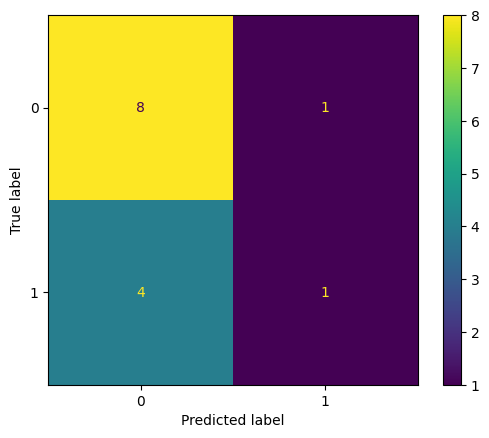

In [ ]:
tprs,aucs,mean_fpr,svm = SVM_ROC(X_std_list[0],y , C= 1.0, kernel = 'sigmoid' , decision_function_shape = 'ovo')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: SVM ROC curve for feature selection with threshold = 0.5')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(svm, xy_testlist_main_2[0][5][0], xy_testlist_main_2[0][5][1])

Text(0.5, 0, 'Permutation Importance')

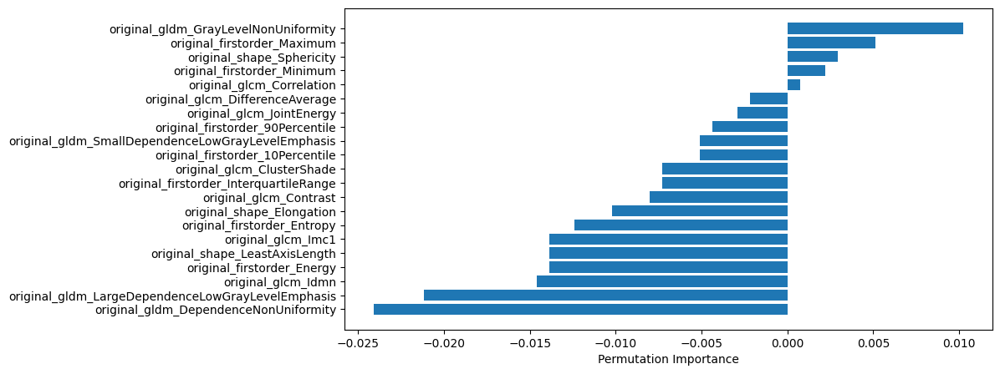

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(svm,X_std_list[0],y, n_repeats=10,random_state=0)
feat  = ['original_firstorder_10Percentile', 'original_firstorder_90Percentile',
       'original_firstorder_Energy', 'original_firstorder_Entropy',
       'original_firstorder_InterquartileRange', 'original_firstorder_Maximum',
       'original_firstorder_Minimum', 'original_glcm_ClusterShade',
       'original_glcm_Contrast', 'original_glcm_Correlation',
       'original_glcm_DifferenceAverage', 'original_glcm_Idmn',
       'original_glcm_Imc1', 'original_glcm_JointEnergy',
       'original_gldm_DependenceNonUniformity',
       'original_gldm_GrayLevelNonUniformity',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'original_shape_Elongation', 'original_shape_LeastAxisLength',
       'original_shape_Sphericity', 'labels', 'Patient_id', 'survival_status']
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(10,5))
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

In [ ]:
'''0 >acc=0.714, est=0.643, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
4 >acc=0.714, est=0.700, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
10 >acc=0.714, est=0.658, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}'''

"0 >acc=0.714, est=0.643, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}\n4 >acc=0.714, est=0.700, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}\n10 >acc=0.714, est=0.658, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}"

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and w

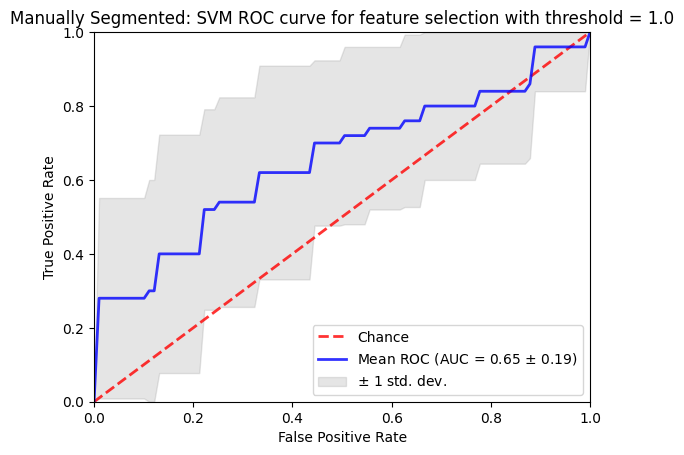

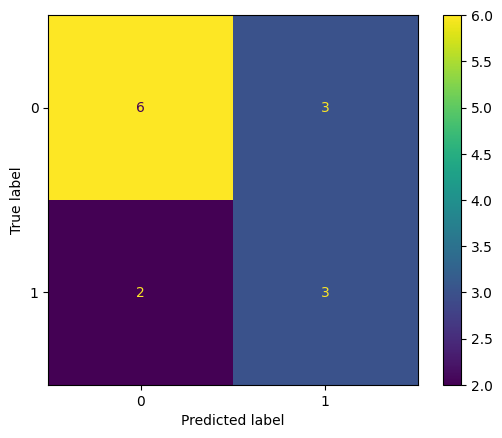

In [ ]:
tprs,aucs,mean_fpr,svm = SVM_ROC(X_std_list[1],y , C= 5, kernel = 'sigmoid' , decision_function_shape = 'ovo')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: SVM ROC curve for feature selection with threshold = 1.0')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(svm, xy_testlist_main_2[1][4][0], xy_testlist_main_2[1][4][1])

Text(0.5, 0, 'Permutation Importance')

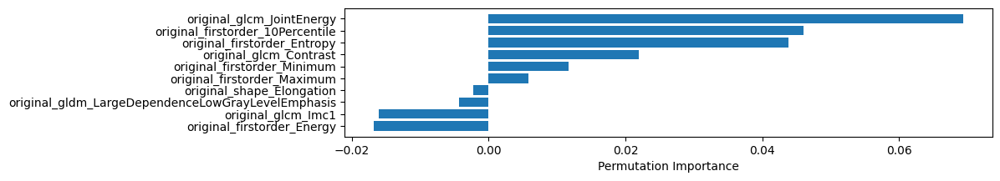

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(svm,X_std_list[1],y, n_repeats=10,random_state=0)
feat  = ['original_firstorder_10Percentile', 'original_firstorder_Energy',
       'original_firstorder_Entropy', 'original_firstorder_Maximum',
       'original_firstorder_Minimum', 'original_glcm_Contrast',
       'original_glcm_Imc1', 'original_glcm_JointEnergy',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_shape_Elongation']
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(10,2))
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

0 >acc=0.786, est=0.643, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and w

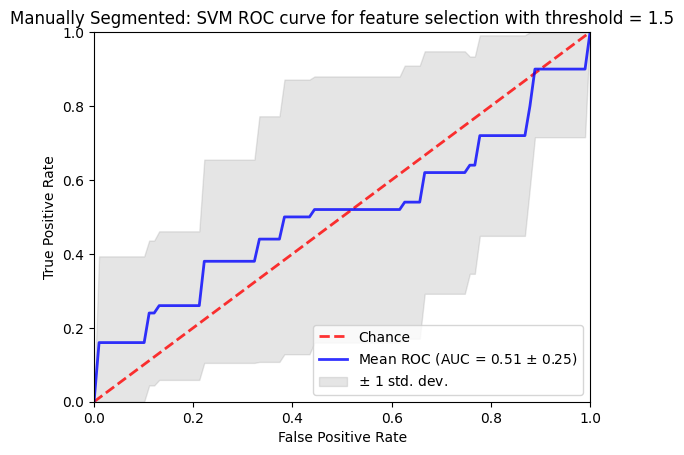

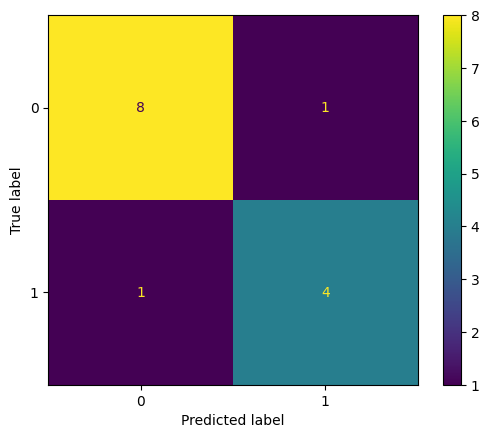

In [ ]:
tprs,aucs,mean_fpr,svm = SVM_ROC(X_std_list[2],y , C= 5, kernel = 'sigmoid' , decision_function_shape = 'ovo')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: SVM ROC curve for feature selection with threshold = 1.5')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(svm, xy_testlist_main_2[2][0][0], xy_testlist_main_2[2][0][1])

Text(0.5, 0, 'Permutation Importance')

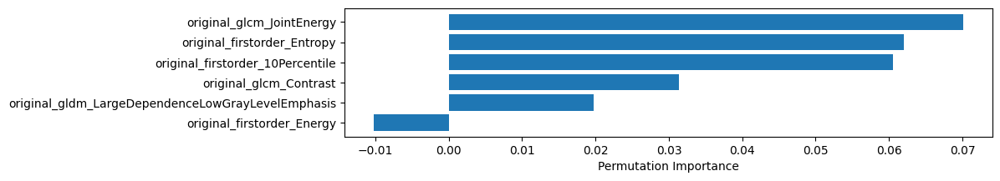

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(svm,X_std_list[2],y, n_repeats=10,random_state=0)
feat  = ['original_firstorder_10Percentile', 'original_firstorder_Energy',
       'original_firstorder_Entropy', 'original_glcm_Contrast',
       'original_glcm_JointEnergy',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis']
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(10,2))
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

#### Feature selection with LASSO

In [ ]:
def lasso(data):
    X = data.iloc[:,0:len(data.columns)-3]
    y = data['labels'].values
    scaler = StandardScaler()
    scaler.fit(X)
    sel_ = SelectFromModel(
        LogisticRegression(C=0.5, penalty='l1', solver='liblinear', random_state=10))
    sel_.fit(scaler.transform(X), y)
    removed_feats = X.columns[(sel_.estimator_.coef_ == 0).ravel().tolist()]
    lasso_data = X.drop(columns=removed_feats, axis = 1)
    return lasso_data , y

##### Random Forest

In [ ]:
lasso_data,y = lasso(data)
stdsc = StandardScaler()
X_std_lasso = stdsc.fit_transform(lasso_data.iloc[:].values)
RF_xy_testlist_3,RF_xy_trainlist_3 = RF_CV(X_std_lasso,y)

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and w

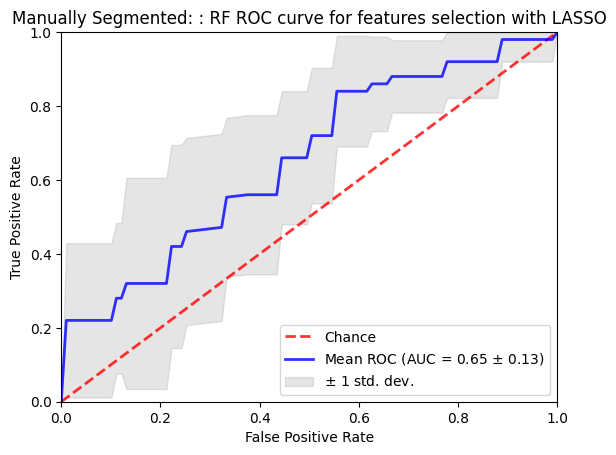

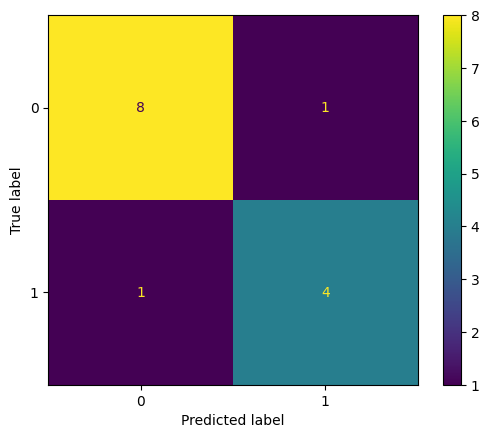

In [ ]:
tprs,aucs,mean_fpr,forest = RandomForest_ROC(X_std_lasso, y , criterion='gini',n_estimators=10,min_samples_leaf=15)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: : RF ROC curve for features selection with LASSO')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(forest, RF_xy_testlist_3[2][0], RF_xy_testlist_3[2][1])

In [ ]:
lasso_data.columns

Index(['original_firstorder_Maximum', 'original_firstorder_Skewness',
       'original_firstorder_TotalEnergy', 'original_glcm_ClusterShade',
       'original_glcm_Imc2', 'original_gldm_DependenceVariance',
       'original_gldm_GrayLevelNonUniformity',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'original_glszm_LargeAreaLowGrayLevelEmphasis',
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_shape_Flatness', 'original_shape_Maximum2DDiameterColumn',
       'original_shape_Sphericity'],
      dtype='object')

Text(0.5, 0, 'Permutation Importance')

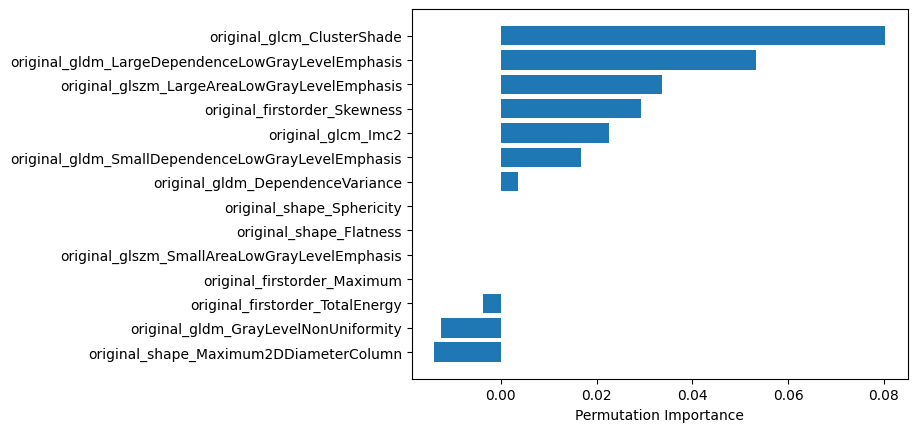

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(forest,X_std_lasso, y, n_repeats=10,random_state=0)
feat  = ['original_firstorder_Maximum', 'original_firstorder_Skewness',
       'original_firstorder_TotalEnergy', 'original_glcm_ClusterShade',
       'original_glcm_Imc2', 'original_gldm_DependenceVariance',
       'original_gldm_GrayLevelNonUniformity',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'original_glszm_LargeAreaLowGrayLevelEmphasis',
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_shape_Flatness', 'original_shape_Maximum2DDiameterColumn',
       'original_shape_Sphericity']
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

##### SVM

In [ ]:
lasso_data,y = lasso(data)
stdsc = StandardScaler()
X_std_lasso = stdsc.fit_transform(lasso_data.iloc[:].values)
xy_testlist_3,xy_trainlist_3 = SVM_CV(X_std_lasso,y)

0 >acc=0.857, est=0.683, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
1 >acc=0.571, est=0.690, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
2 >acc=0.643, est=0.635, cfg={'C': 0.1, 'decision_function_shape': 'ovo', 'kernel': 'rbf'}
3 >acc=0.571, est=0.700, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
4 >acc=0.571, est=0.668, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
5 >acc=0.500, est=0.716, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
6 >acc=0.571, est=0.691, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'rbf'}
7 >acc=0.692, est=0.701, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'sigmoid'}
8 >acc=0.538, est=0.654, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
9 >acc=0.462, est=0.694, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
10 >acc=0.857, est=0.666, cfg={'C': 5, 'decision_function_shape': 'ovo', 'k

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and w

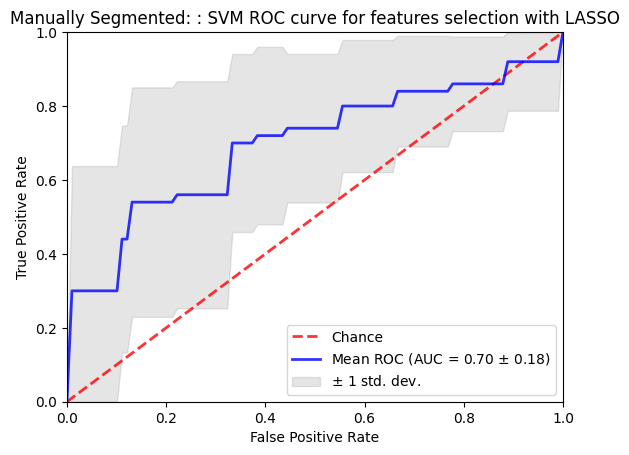

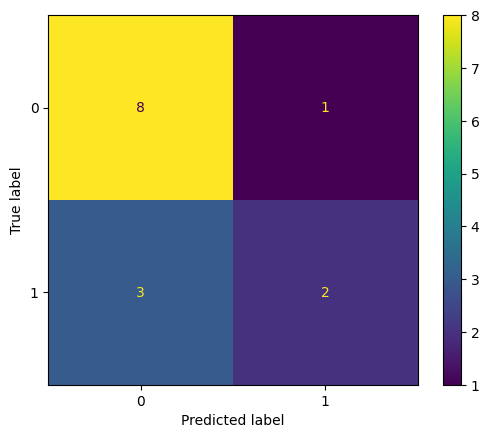

In [ ]:
tprs,aucs,mean_fpr,svm = SVM_ROC(X_std_lasso,y , C= 5, kernel = 'sigmoid' , decision_function_shape = 'ovo')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: : SVM ROC curve for features selection with LASSO')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(svm, xy_testlist_3[13][0], xy_testlist_3[13][1])

In [ ]:
lasso_data.columns

Index(['original_firstorder_Maximum', 'original_firstorder_Skewness',
       'original_firstorder_TotalEnergy', 'original_glcm_ClusterShade',
       'original_glcm_Imc2', 'original_gldm_DependenceVariance',
       'original_gldm_GrayLevelNonUniformity',
       'original_gldm_LargeDependenceLowGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'original_glszm_LargeAreaLowGrayLevelEmphasis',
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_shape_Flatness', 'original_shape_Maximum2DDiameterColumn',
       'original_shape_Sphericity'],
      dtype='object')

Text(0.5, 0, 'Permutation Importance')

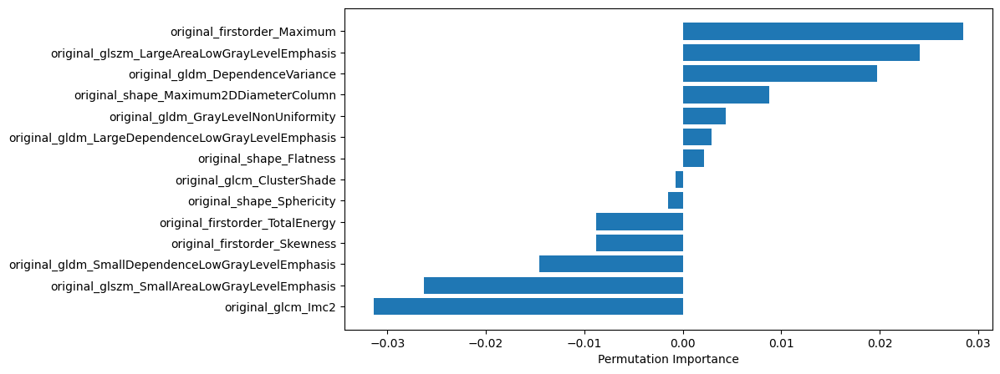

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(svm,X_std_lasso,y, n_repeats=10,random_state=0)
feat  = lasso_data.columns
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(10,5))
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

#### Feature Selection with Anova

In [ ]:
import scipy
def anova(data):
    df_anova = data
    class_mapping = {label: idx for idx, label in enumerate(np.unique(df_anova['survival_status']))}
    df_anova['survival_status'] = df_anova['survival_status'].map(class_mapping)
    y_anova = LabelEncoder().fit_transform(df_anova['survival_status'].values)
    X_anova = df_anova.iloc[:,0:len(df_anova.columns)-3].values
    print(y_anova.shape)
    print(X_anova.shape)
    selector = SelectKBest(f_classif, k=20) # k is the number of features to be selected
    X_new = selector.fit_transform(X_anova, y_anova)
    # print('feature importance: ', selector.scores_)
    # print('pvalues: ', selector.pvalues_)
    # len(selector.pvalues_)
    columns = data.columns[:-3]
    feature_scores = list(zip(selector.scores_,columns))
    sorted_feature_scores = sorted(feature_scores,reverse=True)
    num_list = []
    col_list = []
    for i in range(len(columns)):
        num_list.append(sorted_feature_scores[i][0])
        col_list.append(sorted_feature_scores[i][1])
    plt.bar(col_list[0:10],num_list[0:10])
    plt.xticks(rotation=90)
    dfn = 2 # Inter-level degrees of freedom(3-1)
    dfd = 98 # Intra-level degrees of freedom(2345-2)
    fig, ax = plt.subplots(1, 1)

    plt.xlim(-1,26)
    plt.ylim(0,1)
    x = np.linspace(scipy.stats.f.ppf(0.0000000001, dfn, dfd),scipy.stats.f.ppf(0.9999999999, dfn, dfd), 100)
    ax.plot(x, scipy.stats.f.pdf(x, dfn, dfd), 'r-')
    ax.axvline(scipy.stats.f.ppf(0.95, dfn, dfd), ls = "--", color = "navy")
    print('upper 5%:', scipy.stats.f.ppf(0.95, dfn, dfd))
    importance = pd.DataFrame(num_list,index=col_list,columns=['importance'])
    print("Importance of features",importance)
    top_features = importance.nlargest(5, 'importance')
    print("Top features",top_features.index)
    anova_selected_df = df_anova.copy()
    anova_selected_df  = anova_selected_df[anova_selected_df.columns.intersection(top_features.index)]
    print("Anova info",anova_selected_df.info())
    return anova_selected_df,y_anova


(137,)
(137, 100)
upper 5%: 3.0892030130201875
Importance of features                                                    importance
original_gldm_DependenceVariance                     7.493530
original_glrlm_LongRunHighGrayLevelEmphasis          7.035681
original_glcm_MaximumProbability                     6.642498
original_glcm_ClusterShade                           6.573631
original_gldm_LargeDependenceEmphasis                6.512236
...                                                       ...
original_firstorder_TotalEnergy                      0.007930
original_firstorder_Energy                           0.000261
original_glcm_Contrast                               0.000165
original_firstorder_MeanAbsoluteDeviation            0.000156
original_gldm_SmallDependenceLowGrayLevelEmphasis    0.000019

[100 rows x 1 columns]
Top features Index(['original_gldm_DependenceVariance',
       'original_glrlm_LongRunHighGrayLevelEmphasis',
       'original_glcm_MaximumProbability', 'original

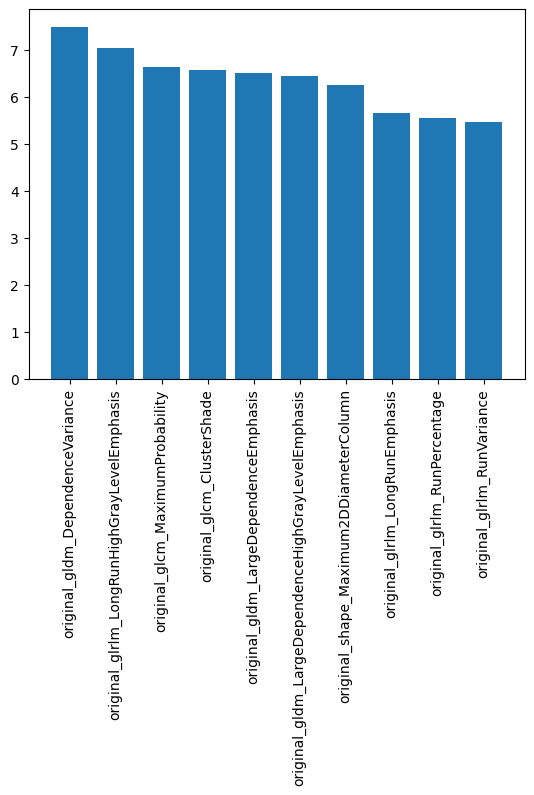

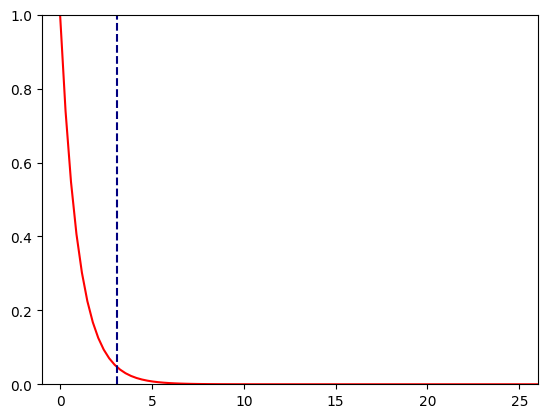

In [ ]:
anova_selected_df,y = anova(data)
X_anova = anova_selected_df.values
stdsc = StandardScaler()
X_std_anova = stdsc.fit_transform(X_anova)
print(X_std_anova.shape)

##### Random Forest

In [ ]:
RF_xy_testlist_4,RF_xy_trainlist_4 = RF_CV(X_std_anova, y)

0 >acc=0.643, est=0.642, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 10}
1 >acc=0.571, est=0.610, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 10}
2 >acc=0.714, est=0.626, cfg={'criterion': 'gini', 'min_samples_leaf': 5, 'n_estimators': 10}
3 >acc=0.714, est=0.617, cfg={'criterion': 'entropy', 'min_samples_leaf': 15, 'n_estimators': 10}
4 >acc=0.357, est=0.676, cfg={'criterion': 'entropy', 'min_samples_leaf': 10, 'n_estimators': 10}
5 >acc=0.500, est=0.627, cfg={'criterion': 'entropy', 'min_samples_leaf': 5, 'n_estimators': 10}
6 >acc=0.429, est=0.691, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 10}
7 >acc=0.462, est=0.685, cfg={'criterion': 'gini', 'min_samples_leaf': 15, 'n_estimators': 500}
8 >acc=0.692, est=0.637, cfg={'criterion': 'entropy', 'min_samples_leaf': 15, 'n_estimators': 10}
9 >acc=0.538, est=0.597, cfg={'criterion': 'gini', 'min_samples_leaf': 10, 'n_estimators': 500}
10 >acc=0.857, est=0.592, cfg={'criteri

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2744458667.py:67: DeprecationWarning:

scipy.interp is deprecated and w

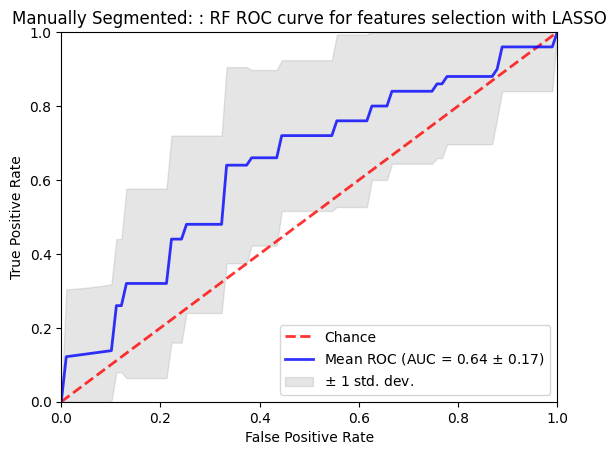

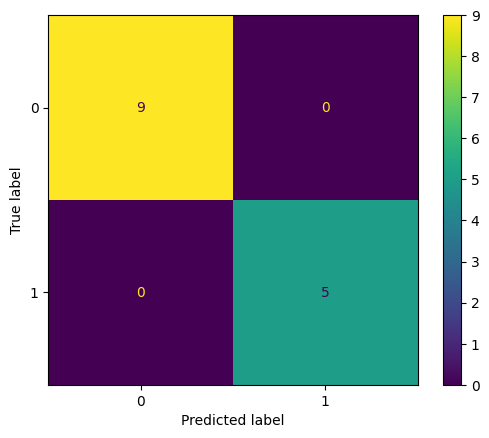

In [ ]:
tprs,aucs,mean_fpr,forest = RandomForest_ROC(X_std_anova, y , criterion='gini',n_estimators=10,min_samples_leaf=5)
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: : RF ROC curve for features selection with LASSO')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(forest, RF_xy_testlist_4[10][0], RF_xy_testlist_4[10][1])

Text(0.5, 0, 'Permutation Importance')

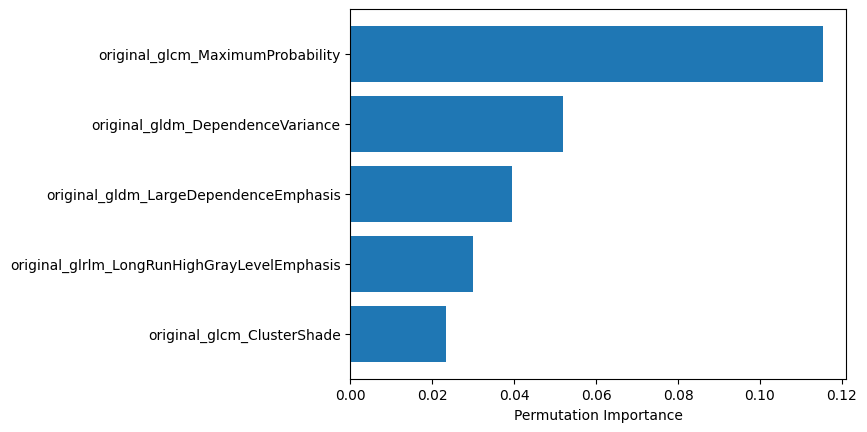

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(forest, X_std_anova, y, n_repeats=10,random_state=0)
feat = ["original_gldm_DependenceVariance","original_glrlm_LongRunHighGrayLevelEmphasis","original_glcm_MaximumProbability","original_glcm_ClusterShade","original_gldm_LargeDependenceEmphasis"]
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

##### SVM

In [ ]:
xy_testlist_4,xy_trainlist_4 = SVM_CV(X_std_anova, y)

0 >acc=0.643, est=0.643, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
1 >acc=0.643, est=0.634, cfg={'C': 0.1, 'decision_function_shape': 'ovo', 'kernel': 'rbf'}
2 >acc=0.643, est=0.659, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
3 >acc=0.643, est=0.643, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
4 >acc=0.571, est=0.693, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
5 >acc=0.500, est=0.682, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'rbf'}
6 >acc=0.571, est=0.658, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
7 >acc=0.538, est=0.677, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'rbf'}
8 >acc=0.692, est=0.646, cfg={'C': 5, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
9 >acc=0.615, est=0.662, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'}
10 >acc=0.714, est=0.642, cfg={'C': 1.0, 'decision_function_shape': 'ovo', 'kernel': 'poly'

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead

/tmp/ipykernel_1705922/2856183511.py:62: DeprecationWarning:

scipy.interp is deprecated and w

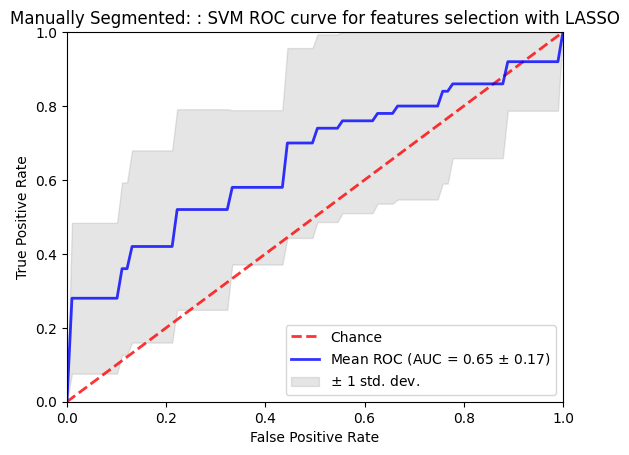

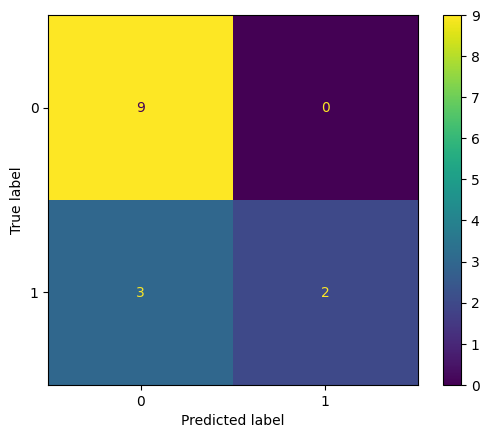

In [ ]:
tprs,aucs,mean_fpr,svm = SVM_ROC(X_std_anova, y , C= 5, kernel = 'poly' , decision_function_shape = 'ovo')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color='b',label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),lw=2, alpha=.8)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,label=r'$\pm$ 1 std. dev.')
plt.xlim([-0, 1])
plt.ylim([-0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Manually Segmented: : SVM ROC curve for features selection with LASSO')
plt.legend(loc="lower right" ,
                #fontsize = 'xx-small'
                )
        #plt.savefig('RFTC_ROC1.jpg',dpi=1200)
plt.show()
ConfusionMatrixDisplay.from_estimator(svm, xy_testlist_4[10][0], xy_testlist_4[10][1])

Text(0.5, 0, 'Permutation Importance')

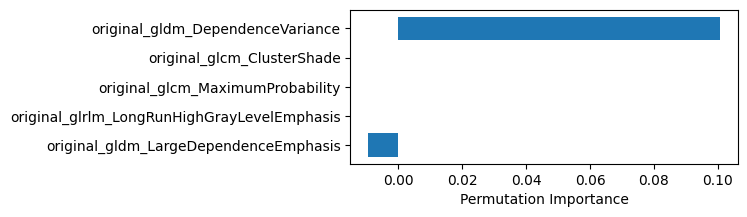

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance
result = permutation_importance(svm,X_anova,y, n_repeats=10,random_state=0)
feat = ["original_gldm_DependenceVariance","original_glrlm_LongRunHighGrayLevelEmphasis","original_glcm_MaximumProbability","original_glcm_ClusterShade","original_gldm_LargeDependenceEmphasis"]
features  =np.array(list(feat)) 
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(5,2))
plt.barh(features[sorted_idx], result.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")